<a href="https://colab.research.google.com/github/pavankum/colab-fold-files/blob/main/ECD_w_Activin_chopped_no_recycle_more_seeds.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://raw.githubusercontent.com/sokrypton/ColabFold/main/.github/ColabFold_Marv_Logo_Small.png" height="200" align="right" style="height:240px">

##ColabFold v1.5.5: AlphaFold2 using MMseqs2

Easy to use protein structure and complex prediction using [AlphaFold2](https://www.nature.com/articles/s41586-021-03819-2) and [Alphafold2-multimer](https://www.biorxiv.org/content/10.1101/2021.10.04.463034v1). Sequence alignments/templates are generated through [MMseqs2](mmseqs.com) and [HHsearch](https://github.com/soedinglab/hh-suite). For more details, see <a href="#Instructions">bottom</a> of the notebook, checkout the [ColabFold GitHub](https://github.com/sokrypton/ColabFold) and [Nature Protocols](https://www.nature.com/articles/s41596-024-01060-5).

Old versions: [v1.4](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.4.0/AlphaFold2.ipynb), [v1.5.1](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.5.1/AlphaFold2.ipynb), [v1.5.2](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.5.2/AlphaFold2.ipynb), [v1.5.3-patch](https://colab.research.google.com/github/sokrypton/ColabFold/blob/56c72044c7d51a311ca99b953a71e552fdc042e1/AlphaFold2.ipynb)

[Mirdita M, Schütze K, Moriwaki Y, Heo L, Ovchinnikov S, Steinegger M. ColabFold: Making protein folding accessible to all.
*Nature Methods*, 2022](https://www.nature.com/articles/s41592-022-01488-1)

In [17]:
#@title Input protein sequence(s), then hit `Runtime` -> `Run all`
from google.colab import files
import os
import re
import hashlib
import random

from sys import version_info
python_version = f"{version_info.major}.{version_info.minor}"

def add_hash(x,y):
  return x+"_"+hashlib.sha1(y.encode()).hexdigest()[:5]

query_sequence = 'LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT:GLECDGKVNICCKKQFFVSFKDIGWNDWIIAPSGYHANYCEGECPSHILKSCCVPTKLRPMSMLYYDDGQNIIKKDIQNMIVEECGCS:GLECDGKVNICCKKQFFVSFKDIGWNDWIIAPSGYHANYCEGECPSHILKSCCVPTKLRPMSMLYYDDGQNIIKKDIQNMIVEECGCS' #@param {type:"string"}
#@markdown  - Use `:` to specify inter-protein chainbreaks for **modeling complexes** (supports homo- and hetro-oligomers). For example **PI...SK:PI...SK** for a homodimer
jobname = 'ECD_w_Activin_chopped' #@param {type:"string"}
# number of models to use
num_relax = 1 #@param [0, 1, 5] {type:"raw"}
#@markdown - specify how many of the top ranked structures to relax using amber
template_mode = "pdb100" #@param ["none", "pdb100","custom"]
#@markdown - `none` = no template information is used. `pdb100` = detect templates in pdb100 (see [notes](#pdb100)). `custom` - upload and search own templates (PDB or mmCIF format, see [notes](#custom_templates))

use_amber = num_relax > 0

# remove whitespaces
query_sequence = "".join(query_sequence.split())

basejobname = "".join(jobname.split())
basejobname = re.sub(r'\W+', '', basejobname)
jobname = add_hash(basejobname, query_sequence)

# check if directory with jobname exists
def check(folder):
  if os.path.exists(folder):
    return False
  else:
    return True
if not check(jobname):
  n = 0
  while not check(f"{jobname}_{n}"): n += 1
  jobname = f"{jobname}_{n}"

# make directory to save results
os.makedirs(jobname, exist_ok=True)

# save queries
queries_path = os.path.join(jobname, f"{jobname}.csv")
with open(queries_path, "w") as text_file:
  text_file.write(f"id,sequence\n{jobname},{query_sequence}")

if template_mode == "pdb100":
  use_templates = True
  custom_template_path = None
elif template_mode == "custom":
  custom_template_path = os.path.join(jobname,f"template")
  os.makedirs(custom_template_path, exist_ok=True)
  uploaded = files.upload()
  use_templates = True
  for fn in uploaded.keys():
    os.rename(fn,os.path.join(custom_template_path,fn))
else:
  custom_template_path = None
  use_templates = False

print("jobname",jobname)
print("sequence",query_sequence)
print("length",len(query_sequence.replace(":","")))

jobname ECD_w_Activin_chopped_c404a
sequence LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT:GLECDGKVNICCKKQFFVSFKDIGWNDWIIAPSGYHANYCEGECPSHILKSCCVPTKLRPMSMLYYDDGQNIIKKDIQNMIVEECGCS:GLECDGKVNICCKKQFFVSFKDIGWNDWIIAPSGYHANYCEGECPSHILKSCCVPTKLRPMSMLYYDDGQNIIKKDIQNMIVEECGCS
length 598


In [18]:
#@title Install dependencies
%%time
import os
USE_AMBER = use_amber
USE_TEMPLATES = use_templates
PYTHON_VERSION = python_version

if not os.path.isfile("COLABFOLD_READY"):
  print("installing colabfold...")
  os.system("pip install -q --no-warn-conflicts 'colabfold[alphafold-minus-jax] @ git+https://github.com/sokrypton/ColabFold'")
  if os.environ.get('TPU_NAME', False) != False:
    os.system("pip uninstall -y jax jaxlib")
    os.system("pip install --no-warn-conflicts --upgrade dm-haiku==0.0.10 'jax[cuda12_pip]'==0.3.25 -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/colabfold colabfold")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/alphafold alphafold")
  os.system("touch COLABFOLD_READY")

if USE_AMBER or USE_TEMPLATES:
  if not os.path.isfile("CONDA_READY"):
    print("installing conda...")
    os.system("wget -qnc https://github.com/conda-forge/miniforge/releases/latest/download/Miniforge3-Linux-x86_64.sh")
    os.system("bash Miniforge3-Linux-x86_64.sh -bfp /usr/local")
    os.system("mamba config --set auto_update_conda false")
    os.system("touch CONDA_READY")

if USE_TEMPLATES and not os.path.isfile("HH_READY") and USE_AMBER and not os.path.isfile("AMBER_READY"):
  print("installing hhsuite and amber...")
  os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
  os.system("touch HH_READY")
  os.system("touch AMBER_READY")
else:
  if USE_TEMPLATES and not os.path.isfile("HH_READY"):
    print("installing hhsuite...")
    os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 python='{PYTHON_VERSION}'")
    os.system("touch HH_READY")
  if USE_AMBER and not os.path.isfile("AMBER_READY"):
    print("installing amber...")
    os.system(f"mamba install -y -c conda-forge openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
    os.system("touch AMBER_READY")

CPU times: user 832 µs, sys: 0 ns, total: 832 µs
Wall time: 682 µs


In [19]:
#@markdown ### MSA options (custom MSA upload, single sequence, pairing mode)
msa_mode = "mmseqs2_uniref_env" #@param ["mmseqs2_uniref_env", "mmseqs2_uniref","single_sequence","custom"]
pair_mode = "unpaired_paired" #@param ["unpaired_paired","paired","unpaired"] {type:"string"}
#@markdown - "unpaired_paired" = pair sequences from same species + unpaired MSA, "unpaired" = seperate MSA for each chain, "paired" - only use paired sequences.

# decide which a3m to use
if "mmseqs2" in msa_mode:
  a3m_file = os.path.join(jobname,f"{jobname}.a3m")

elif msa_mode == "custom":
  a3m_file = os.path.join(jobname,f"{jobname}.custom.a3m")
  if not os.path.isfile(a3m_file):
    custom_msa_dict = files.upload()
    custom_msa = list(custom_msa_dict.keys())[0]
    header = 0
    import fileinput
    for line in fileinput.FileInput(custom_msa,inplace=1):
      if line.startswith(">"):
         header = header + 1
      if not line.rstrip():
        continue
      if line.startswith(">") == False and header == 1:
         query_sequence = line.rstrip()
      print(line, end='')

    os.rename(custom_msa, a3m_file)
    queries_path=a3m_file
    print(f"moving {custom_msa} to {a3m_file}")

else:
  a3m_file = os.path.join(jobname,f"{jobname}.single_sequence.a3m")
  with open(a3m_file, "w") as text_file:
    text_file.write(">1\n%s" % query_sequence)

In [20]:
#@markdown ### Advanced settings
model_type = "alphafold2_multimer_v3" #@param ["auto", "alphafold2_ptm", "alphafold2_multimer_v1", "alphafold2_multimer_v2", "alphafold2_multimer_v3", "deepfold_v1"]
#@markdown - if `auto` selected, will use `alphafold2_ptm` for monomer prediction and `alphafold2_multimer_v3` for complex prediction.
#@markdown Any of the mode_types can be used (regardless if input is monomer or complex).
num_recycles = "0" #@param ["auto", "0", "1", "3", "6", "12", "24", "48"]
#@markdown - if `auto` selected, will use `num_recycles=20` if `model_type=alphafold2_multimer_v3`, else `num_recycles=3` .
recycle_early_stop_tolerance = "auto" #@param ["auto", "0.0", "0.5", "1.0"]
#@markdown - if `auto` selected, will use `tol=0.5` if `model_type=alphafold2_multimer_v3` else `tol=0.0`.
relax_max_iterations = 2000 #@param [0, 200, 2000] {type:"raw"}
#@markdown - max amber relax iterations, `0` = unlimited (AlphaFold2 default, can take very long)
pairing_strategy = "greedy" #@param ["greedy", "complete"] {type:"string"}
#@markdown - `greedy` = pair any taxonomically matching subsets, `complete` = all sequences have to match in one line.


#@markdown #### Sample settings
#@markdown -  enable dropouts and increase number of seeds to sample predictions from uncertainty of the model.
#@markdown -  decrease `max_msa` to increase uncertainity
max_msa = "auto" #@param ["auto", "512:1024", "256:512", "64:128", "32:64", "16:32"]
num_seeds = 16 #@param [1,2,4,8,16] {type:"raw"}
use_dropout = True #@param {type:"boolean"}

num_recycles = None if num_recycles == "auto" else int(num_recycles)
recycle_early_stop_tolerance = None if recycle_early_stop_tolerance == "auto" else float(recycle_early_stop_tolerance)
if max_msa == "auto": max_msa = None

#@markdown #### Save settings
save_all = False #@param {type:"boolean"}
save_recycles = False #@param {type:"boolean"}
save_to_google_drive = True #@param {type:"boolean"}
#@markdown -  if the save_to_google_drive option was selected, the result zip will be uploaded to your Google Drive
dpi = 300 #@param {type:"integer"}
#@markdown - set dpi for image resolution

if save_to_google_drive:
  from pydrive2.drive import GoogleDrive
  from pydrive2.auth import GoogleAuth
  from google.colab import auth
  from oauth2client.client import GoogleCredentials
  auth.authenticate_user()
  gauth = GoogleAuth()
  gauth.credentials = GoogleCredentials.get_application_default()
  drive = GoogleDrive(gauth)
  print("You are logged into Google Drive and are good to go!")

#@markdown Don't forget to hit `Runtime` -> `Run all` after updating the form.

You are logged into Google Drive and are good to go!


2024-11-06 22:13:49,425 Running on GPU
2024-11-06 22:13:49,428 Found 9 citations for tools or databases
2024-11-06 22:13:49,428 Query 1/1: ECD_w_Activin_chopped_c404a (length 598)


PENDING:   0%|          | 0/450 [elapsed: 00:00 remaining: ?]

2024-11-06 22:13:49,714 Sleeping for 10s. Reason: PENDING


PENDING:   0%|          | 0/450 [elapsed: 00:10 remaining: ?]

2024-11-06 22:14:00,032 Sleeping for 7s. Reason: PENDING


PENDING:   0%|          | 0/450 [elapsed: 00:17 remaining: ?]

2024-11-06 22:14:07,334 Sleeping for 7s. Reason: PENDING


PENDING:   0%|          | 0/450 [elapsed: 00:25 remaining: ?]

2024-11-06 22:14:14,615 Sleeping for 5s. Reason: PENDING


PENDING:   0%|          | 0/450 [elapsed: 00:30 remaining: ?]

2024-11-06 22:14:19,910 Sleeping for 9s. Reason: PENDING


PENDING:   0%|          | 0/450 [elapsed: 00:39 remaining: ?]

2024-11-06 22:14:29,198 Sleeping for 8s. Reason: PENDING


PENDING:   0%|          | 0/450 [elapsed: 00:48 remaining: ?]

2024-11-06 22:14:37,487 Sleeping for 9s. Reason: PENDING


RUNNING:   2%|▏         | 9/450 [elapsed: 00:57 remaining: 46:49]

2024-11-06 22:14:46,779 Sleeping for 9s. Reason: RUNNING


RUNNING:   4%|▍         | 18/450 [elapsed: 01:06 remaining: 23:15]

2024-11-06 22:14:56,071 Sleeping for 8s. Reason: RUNNING


RUNNING:   6%|▌         | 26/450 [elapsed: 01:14 remaining: 16:11]

2024-11-06 22:15:04,351 Sleeping for 8s. Reason: RUNNING


RUNNING:   8%|▊         | 34/450 [elapsed: 01:23 remaining: 12:36]

2024-11-06 22:15:12,694 Sleeping for 10s. Reason: RUNNING


RUNNING:  10%|▉         | 44/450 [elapsed: 01:33 remaining: 10:08]

2024-11-06 22:15:22,985 Sleeping for 8s. Reason: RUNNING


RUNNING:  12%|█▏        | 52/450 [elapsed: 01:41 remaining: 08:59]

2024-11-06 22:15:31,354 Sleeping for 9s. Reason: RUNNING


RUNNING:  14%|█▎        | 61/450 [elapsed: 01:51 remaining: 08:05]

2024-11-06 22:15:40,660 Sleeping for 7s. Reason: RUNNING


RUNNING:  15%|█▌        | 68/450 [elapsed: 01:58 remaining: 07:35]

2024-11-06 22:15:47,951 Sleeping for 8s. Reason: RUNNING


RUNNING:  17%|█▋        | 76/450 [elapsed: 02:07 remaining: 07:12]

2024-11-06 22:15:56,541 Sleeping for 8s. Reason: RUNNING


RUNNING:  19%|█▊        | 84/450 [elapsed: 02:15 remaining: 06:55]

2024-11-06 22:16:05,280 Sleeping for 6s. Reason: RUNNING


COMPLETE: 100%|██████████| 450/450 [elapsed: 02:22 remaining: 00:00]


2024-11-06 22:16:23,823 Sequence 0 found templates: ['7oly_K', '7mrz_C', '2l5s_A', '6mac_K', '2pjy_C', '2k3g_A', '2qjb_D', '2qja_D', '3kfd_L', '2qj9_D', '2qj9_C', '1rew_D', '2qjb_C', '3kfd_K', '2h62_C', '2qja_C', '3evs_C', '1es7_B', '7yru_A', '7mrz_C']
2024-11-06 22:16:27,781 Sequence 1 found templates: ['7mrz_C', '2goo_C', '7u5p_A', '1s4y_A', '1bte_A', '1nys_A', '1nyu_A', '1nyu_C', '7l0j_B', '7ppc_L', '7u5o_F', '7ppc_J', '7u5o_E', '2hlr_A', '2hlq_A', '7ppa_D', '7ppb_B', '7ppa_C', '7ppc_I', '7u5o_G']
2024-11-06 22:16:32,047 Sequence 2 found templates: ['2p6a_B', '6y6o_A', '2p6a_A', '6y6n_B', '7u5p_H', '2arv_B', '7u5p_F', '6y6o_B', '7u5p_B', '7u5p_D', '1nys_B', '5hly_A', '1nyu_B', '5hlz_F', '2arp_A', '5hlz_H', '3b4v_A', '1s4y_D', '3b4v_E', '5hlz_D']


PENDING:   0%|          | 0/450 [elapsed: 00:00 remaining: ?]

2024-11-06 22:16:32,339 Sleeping for 10s. Reason: PENDING


RUNNING:   2%|▏         | 10/450 [elapsed: 00:10 remaining: 07:44]

2024-11-06 22:16:42,626 Sleeping for 5s. Reason: RUNNING


RUNNING:   3%|▎         | 15/450 [elapsed: 00:15 remaining: 07:39]

2024-11-06 22:16:47,915 Sleeping for 7s. Reason: RUNNING


RUNNING:   5%|▍         | 22/450 [elapsed: 00:23 remaining: 07:29]

2024-11-06 22:16:55,202 Sleeping for 9s. Reason: RUNNING


RUNNING:   7%|▋         | 31/450 [elapsed: 00:32 remaining: 07:16]

2024-11-06 22:17:04,513 Sleeping for 5s. Reason: RUNNING


RUNNING:   8%|▊         | 36/450 [elapsed: 00:37 remaining: 07:13]

2024-11-06 22:17:09,807 Sleeping for 10s. Reason: RUNNING


COMPLETE: 100%|██████████| 450/450 [elapsed: 00:48 remaining: 00:00]


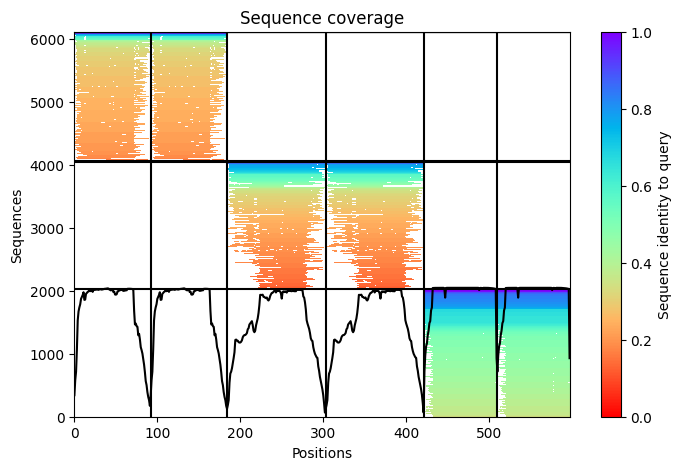

2024-11-06 22:17:22,353 Setting max_seq=508, max_extra_seq=2048
2024-11-06 22:18:54,345 alphafold2_multimer_v3_model_1_seed_000 recycle=0 pLDDT=63.4 pTM=0.417 ipTM=0.331
2024-11-06 22:18:54,347 alphafold2_multimer_v3_model_1_seed_000 took 87.5s (0 recycles)


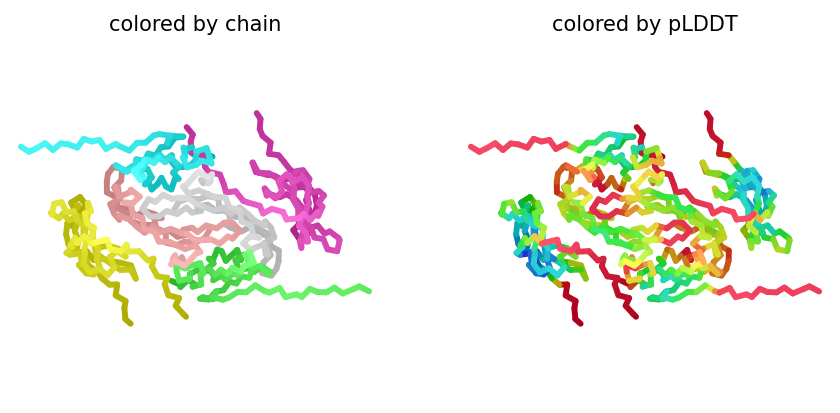

2024-11-06 22:19:04,494 alphafold2_multimer_v3_model_2_seed_000 recycle=0 pLDDT=60.2 pTM=0.384 ipTM=0.291
2024-11-06 22:19:04,495 alphafold2_multimer_v3_model_2_seed_000 took 9.5s (0 recycles)


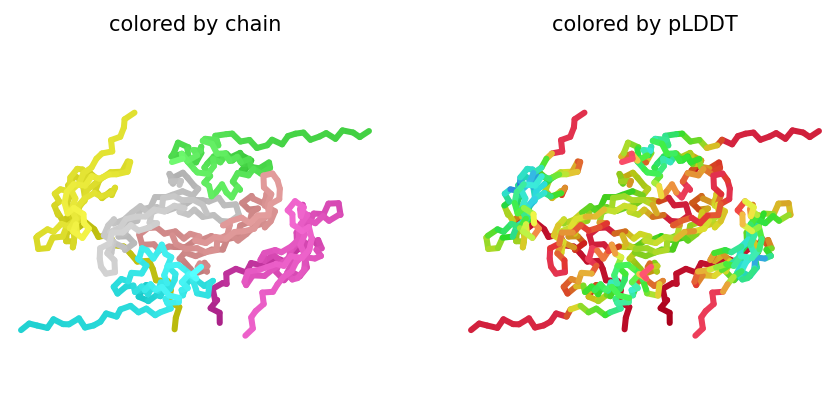

2024-11-06 22:19:14,635 alphafold2_multimer_v3_model_3_seed_000 recycle=0 pLDDT=61 pTM=0.496 ipTM=0.423
2024-11-06 22:19:14,637 alphafold2_multimer_v3_model_3_seed_000 took 9.5s (0 recycles)


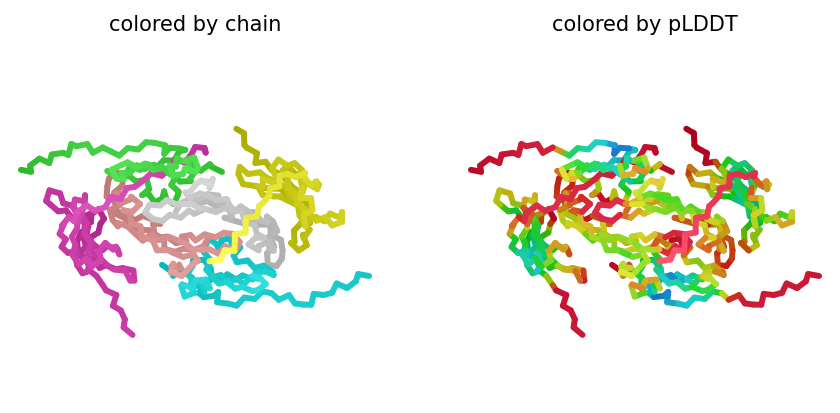

2024-11-06 22:19:25,666 alphafold2_multimer_v3_model_4_seed_000 recycle=0 pLDDT=64.3 pTM=0.607 ipTM=0.553
2024-11-06 22:19:25,668 alphafold2_multimer_v3_model_4_seed_000 took 9.5s (0 recycles)


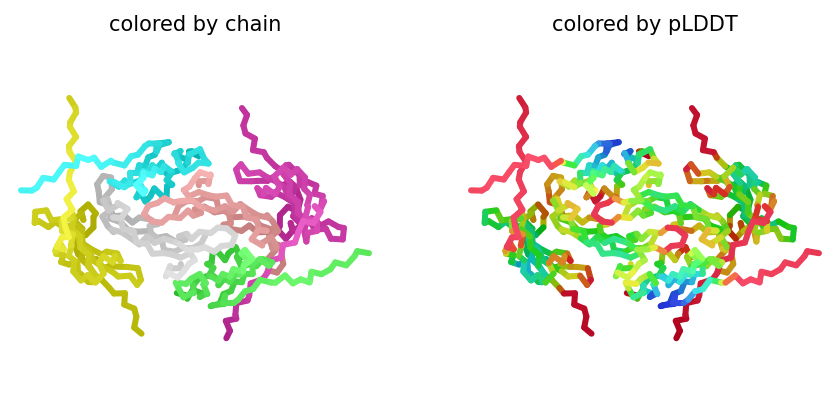

2024-11-06 22:19:35,853 alphafold2_multimer_v3_model_5_seed_000 recycle=0 pLDDT=76.9 pTM=0.726 ipTM=0.688
2024-11-06 22:19:35,855 alphafold2_multimer_v3_model_5_seed_000 took 9.5s (0 recycles)


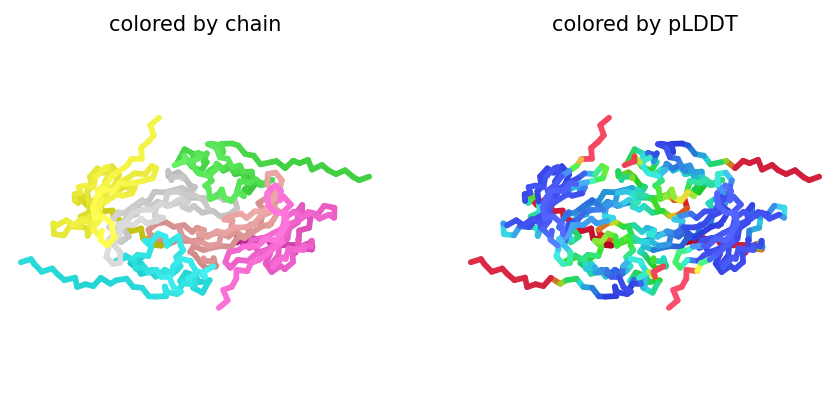

2024-11-06 22:19:46,022 alphafold2_multimer_v3_model_1_seed_001 recycle=0 pLDDT=62.4 pTM=0.43 ipTM=0.344
2024-11-06 22:19:46,023 alphafold2_multimer_v3_model_1_seed_001 took 9.5s (0 recycles)


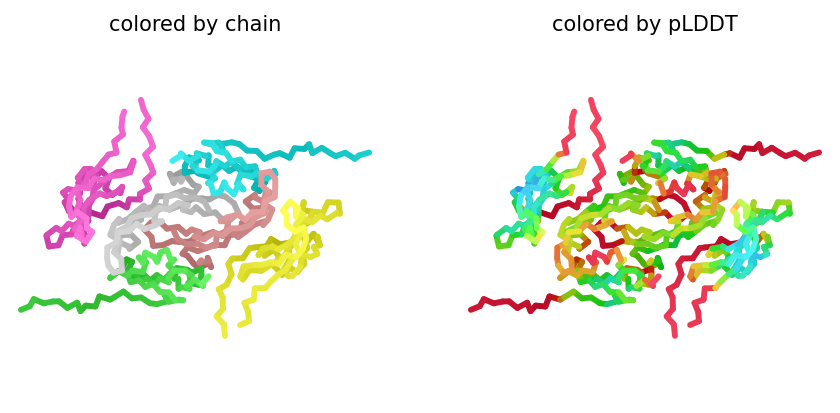

2024-11-06 22:19:56,185 alphafold2_multimer_v3_model_2_seed_001 recycle=0 pLDDT=71.8 pTM=0.505 ipTM=0.432
2024-11-06 22:19:56,187 alphafold2_multimer_v3_model_2_seed_001 took 9.5s (0 recycles)


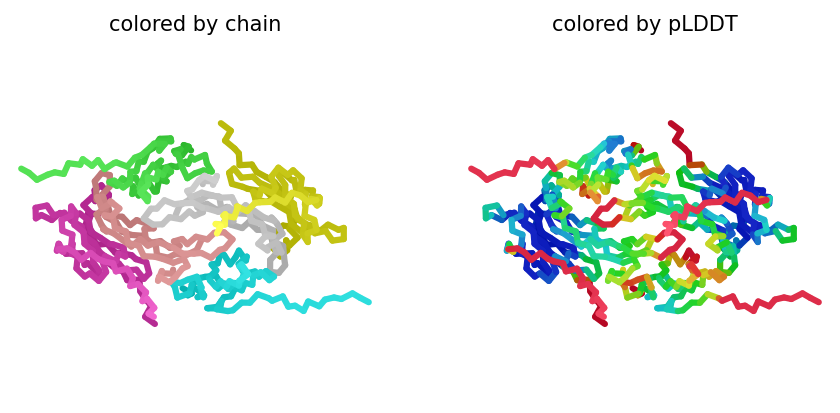

2024-11-06 22:20:06,355 alphafold2_multimer_v3_model_3_seed_001 recycle=0 pLDDT=61.1 pTM=0.392 ipTM=0.304
2024-11-06 22:20:06,356 alphafold2_multimer_v3_model_3_seed_001 took 9.5s (0 recycles)


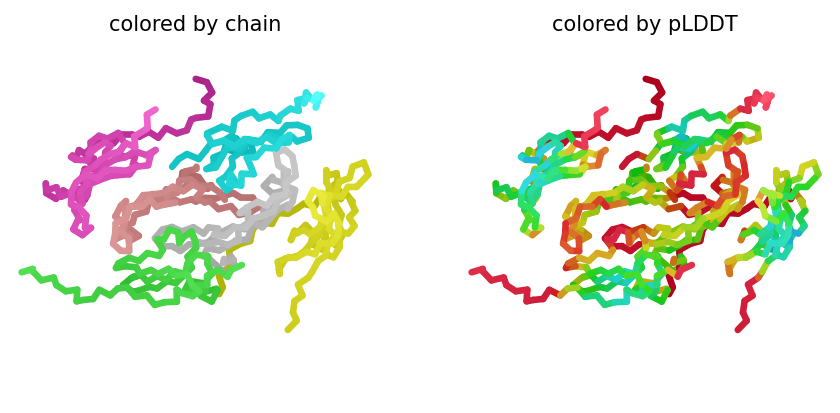

2024-11-06 22:20:16,555 alphafold2_multimer_v3_model_4_seed_001 recycle=0 pLDDT=74.1 pTM=0.51 ipTM=0.441
2024-11-06 22:20:16,557 alphafold2_multimer_v3_model_4_seed_001 took 9.5s (0 recycles)


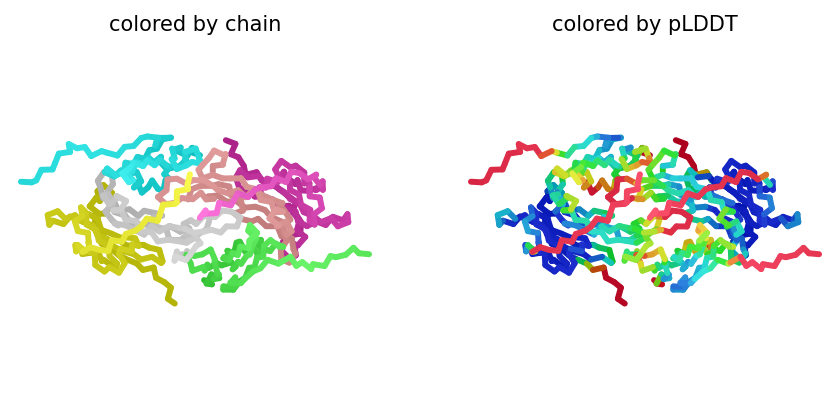

2024-11-06 22:20:26,745 alphafold2_multimer_v3_model_5_seed_001 recycle=0 pLDDT=78 pTM=0.72 ipTM=0.681
2024-11-06 22:20:26,746 alphafold2_multimer_v3_model_5_seed_001 took 9.5s (0 recycles)


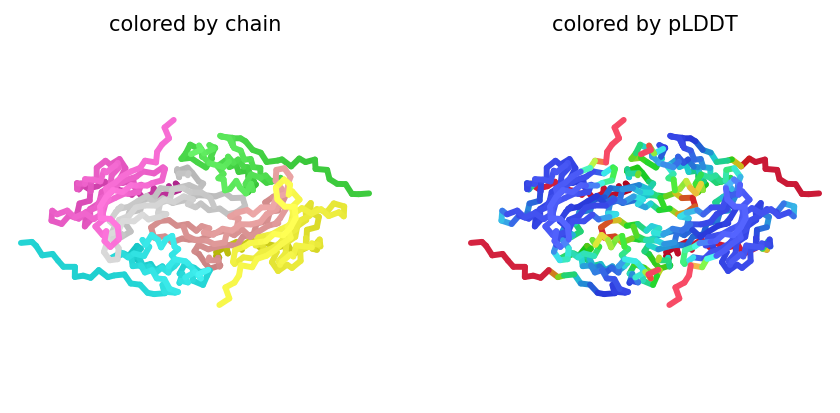

2024-11-06 22:20:36,976 alphafold2_multimer_v3_model_1_seed_002 recycle=0 pLDDT=62 pTM=0.372 ipTM=0.28
2024-11-06 22:20:36,978 alphafold2_multimer_v3_model_1_seed_002 took 9.5s (0 recycles)


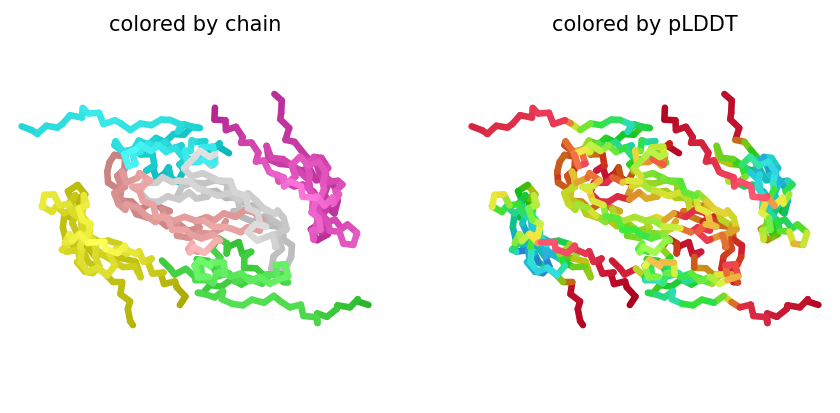

2024-11-06 22:20:47,155 alphafold2_multimer_v3_model_2_seed_002 recycle=0 pLDDT=61.7 pTM=0.555 ipTM=0.491
2024-11-06 22:20:47,156 alphafold2_multimer_v3_model_2_seed_002 took 9.5s (0 recycles)


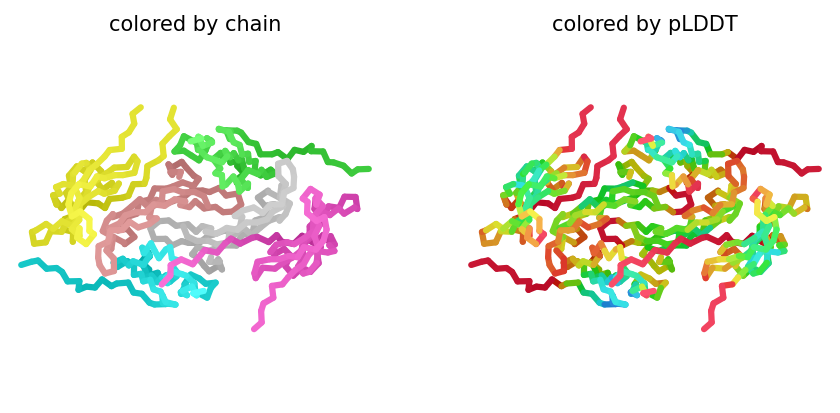

2024-11-06 22:20:57,370 alphafold2_multimer_v3_model_3_seed_002 recycle=0 pLDDT=60.8 pTM=0.455 ipTM=0.378
2024-11-06 22:20:57,371 alphafold2_multimer_v3_model_3_seed_002 took 9.5s (0 recycles)


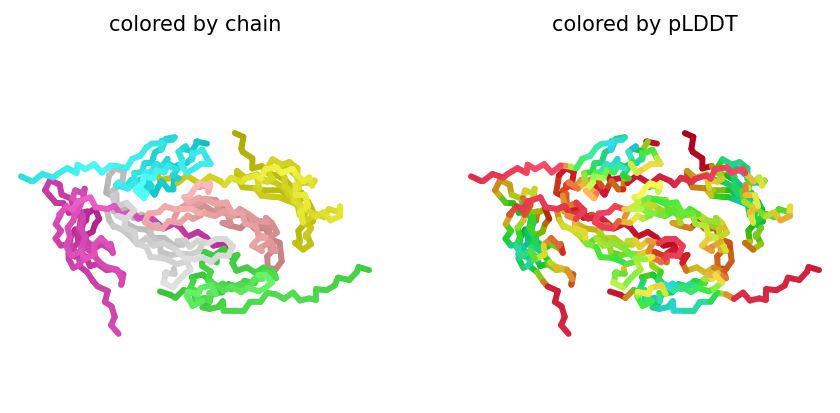

2024-11-06 22:21:07,553 alphafold2_multimer_v3_model_4_seed_002 recycle=0 pLDDT=72.1 pTM=0.507 ipTM=0.436
2024-11-06 22:21:07,554 alphafold2_multimer_v3_model_4_seed_002 took 9.5s (0 recycles)


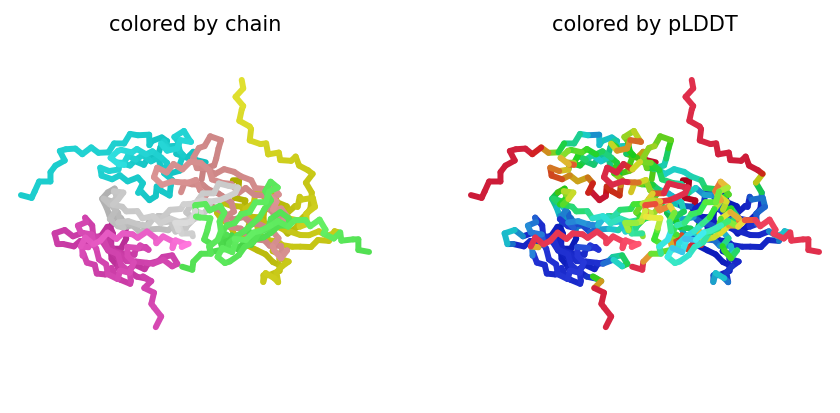

2024-11-06 22:21:17,716 alphafold2_multimer_v3_model_5_seed_002 recycle=0 pLDDT=61.3 pTM=0.612 ipTM=0.556
2024-11-06 22:21:17,718 alphafold2_multimer_v3_model_5_seed_002 took 9.5s (0 recycles)


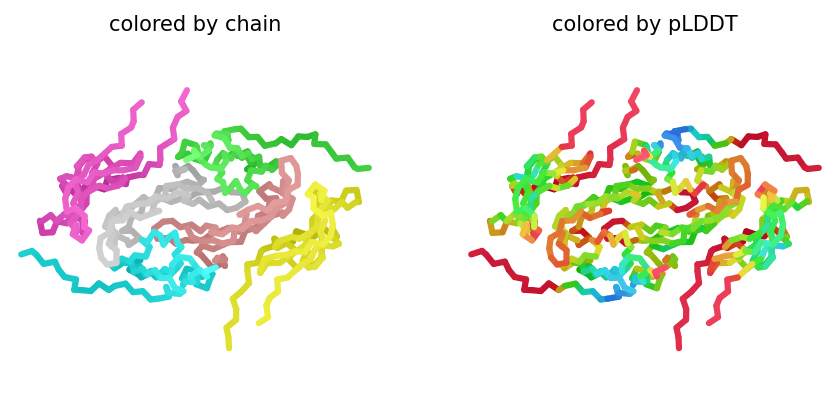

2024-11-06 22:21:27,893 alphafold2_multimer_v3_model_1_seed_003 recycle=0 pLDDT=63.4 pTM=0.49 ipTM=0.412
2024-11-06 22:21:27,895 alphafold2_multimer_v3_model_1_seed_003 took 9.5s (0 recycles)


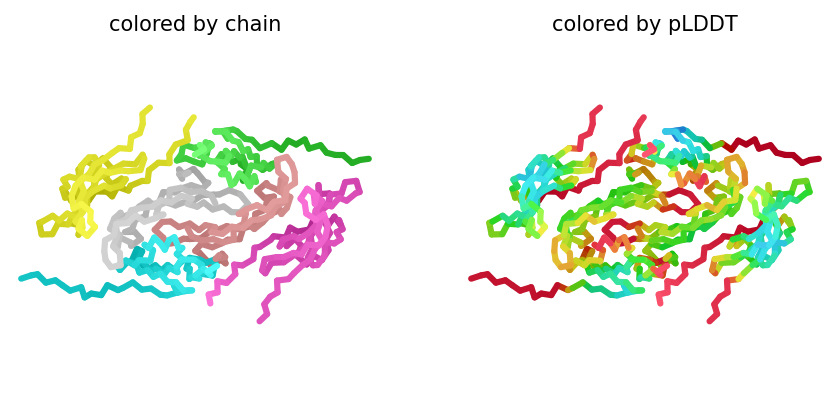

2024-11-06 22:21:38,083 alphafold2_multimer_v3_model_2_seed_003 recycle=0 pLDDT=63.7 pTM=0.482 ipTM=0.405
2024-11-06 22:21:38,084 alphafold2_multimer_v3_model_2_seed_003 took 9.5s (0 recycles)


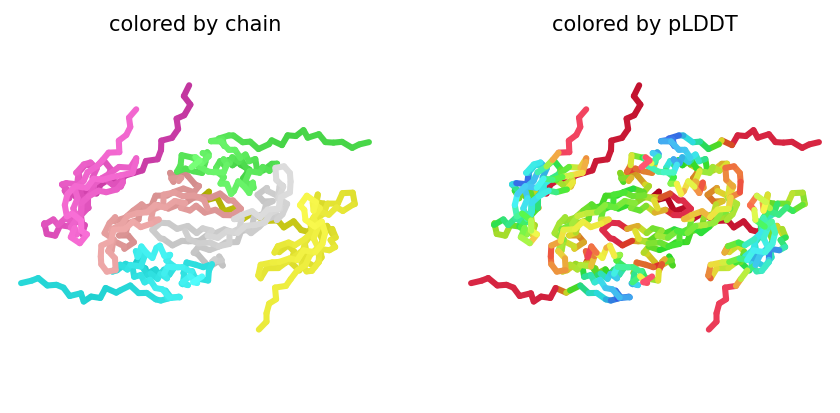

2024-11-06 22:21:48,258 alphafold2_multimer_v3_model_3_seed_003 recycle=0 pLDDT=60.5 pTM=0.495 ipTM=0.422
2024-11-06 22:21:48,260 alphafold2_multimer_v3_model_3_seed_003 took 9.5s (0 recycles)


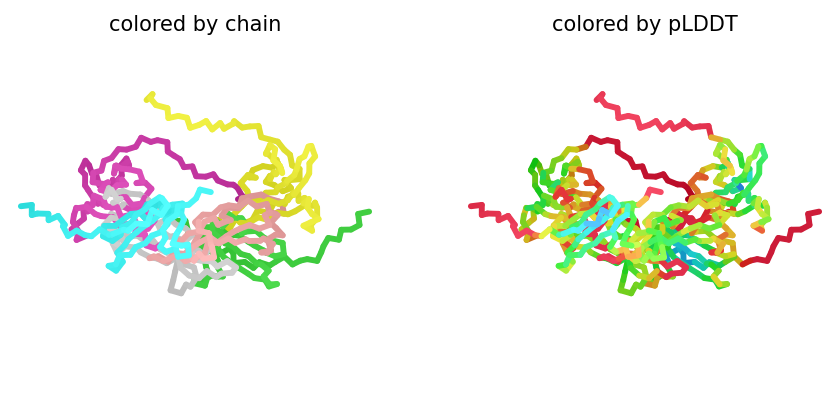

2024-11-06 22:21:58,434 alphafold2_multimer_v3_model_4_seed_003 recycle=0 pLDDT=63.4 pTM=0.424 ipTM=0.34
2024-11-06 22:21:58,435 alphafold2_multimer_v3_model_4_seed_003 took 9.5s (0 recycles)


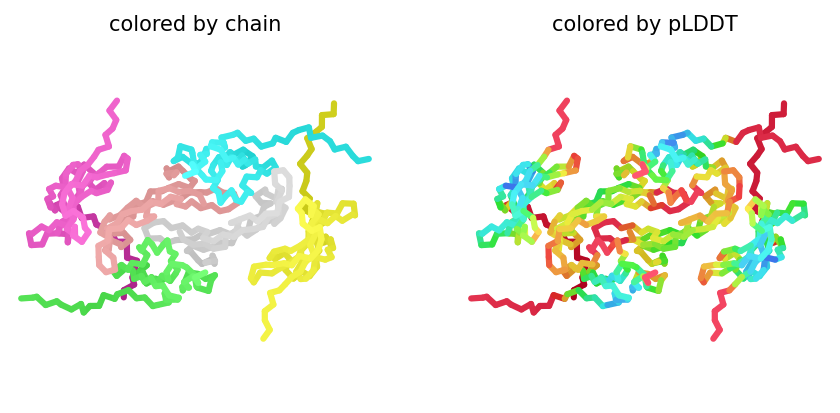

2024-11-06 22:22:08,588 alphafold2_multimer_v3_model_5_seed_003 recycle=0 pLDDT=59.5 pTM=0.572 ipTM=0.511
2024-11-06 22:22:08,590 alphafold2_multimer_v3_model_5_seed_003 took 9.5s (0 recycles)


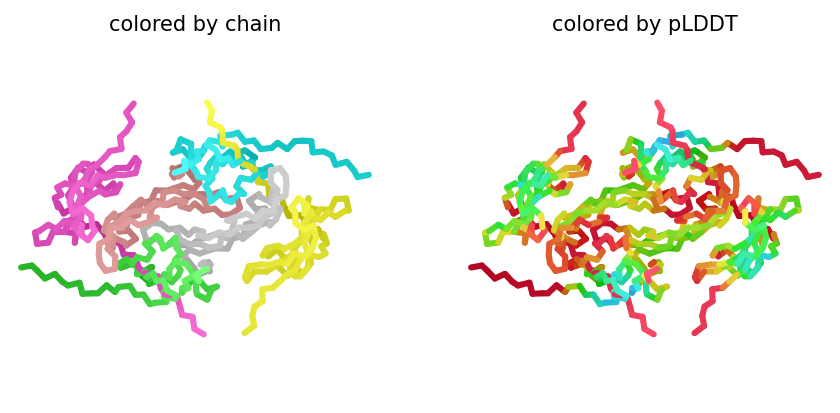

2024-11-06 22:22:18,775 alphafold2_multimer_v3_model_1_seed_004 recycle=0 pLDDT=72.1 pTM=0.467 ipTM=0.389
2024-11-06 22:22:18,777 alphafold2_multimer_v3_model_1_seed_004 took 9.5s (0 recycles)


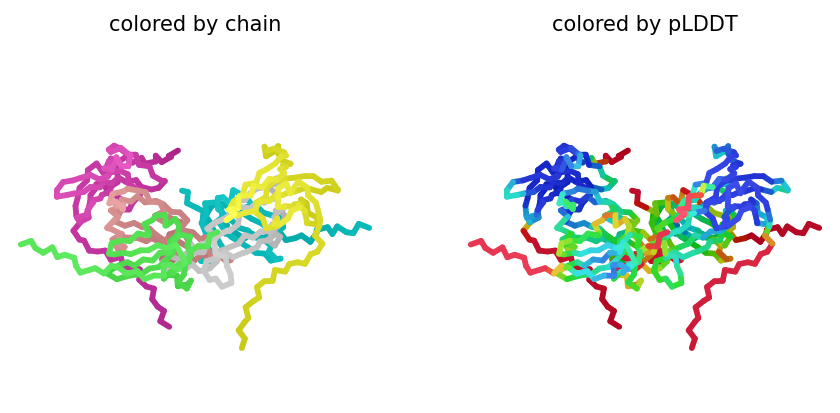

2024-11-06 22:22:28,932 alphafold2_multimer_v3_model_2_seed_004 recycle=0 pLDDT=61.5 pTM=0.466 ipTM=0.393
2024-11-06 22:22:28,933 alphafold2_multimer_v3_model_2_seed_004 took 9.5s (0 recycles)


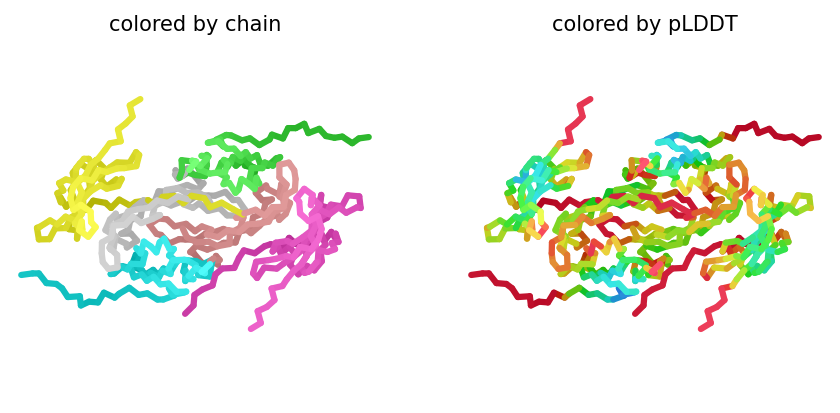

2024-11-06 22:22:39,120 alphafold2_multimer_v3_model_3_seed_004 recycle=0 pLDDT=60.7 pTM=0.394 ipTM=0.309
2024-11-06 22:22:39,122 alphafold2_multimer_v3_model_3_seed_004 took 9.5s (0 recycles)


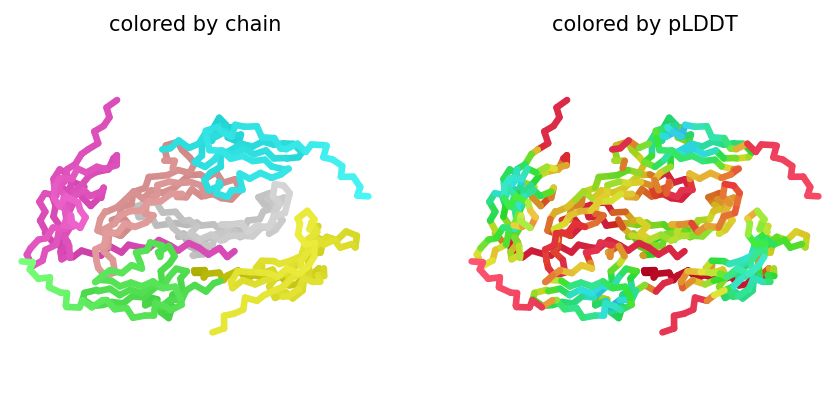

2024-11-06 22:22:49,362 alphafold2_multimer_v3_model_4_seed_004 recycle=0 pLDDT=61.7 pTM=0.29 ipTM=0.18
2024-11-06 22:22:49,364 alphafold2_multimer_v3_model_4_seed_004 took 9.5s (0 recycles)


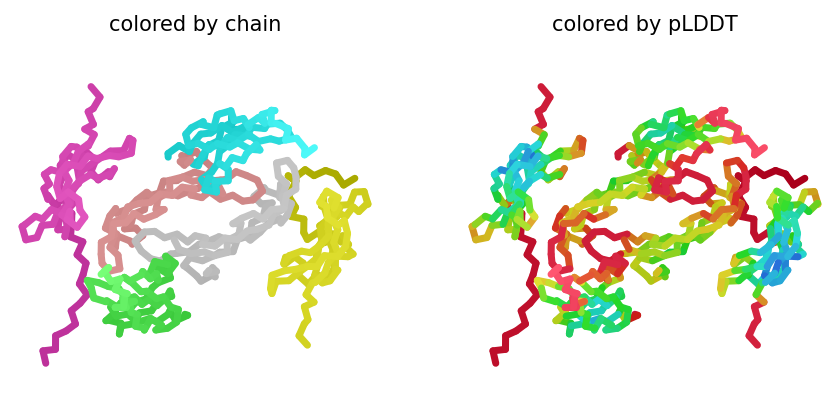

2024-11-06 22:22:59,555 alphafold2_multimer_v3_model_5_seed_004 recycle=0 pLDDT=62.9 pTM=0.685 ipTM=0.641
2024-11-06 22:22:59,556 alphafold2_multimer_v3_model_5_seed_004 took 9.5s (0 recycles)


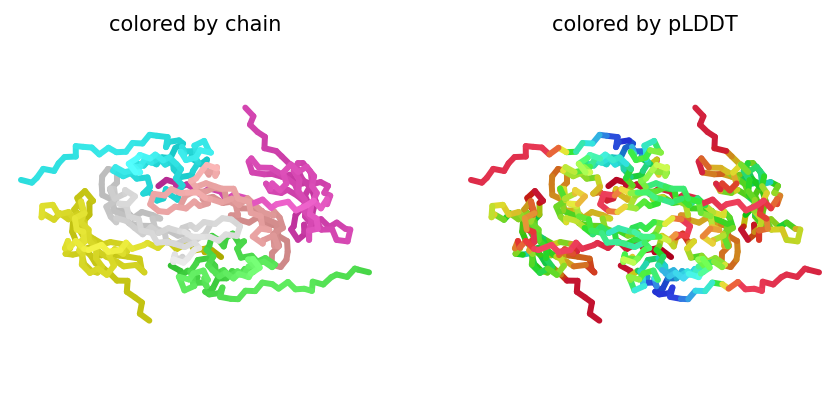

2024-11-06 22:23:09,736 alphafold2_multimer_v3_model_1_seed_005 recycle=0 pLDDT=62.6 pTM=0.451 ipTM=0.371
2024-11-06 22:23:09,738 alphafold2_multimer_v3_model_1_seed_005 took 9.5s (0 recycles)


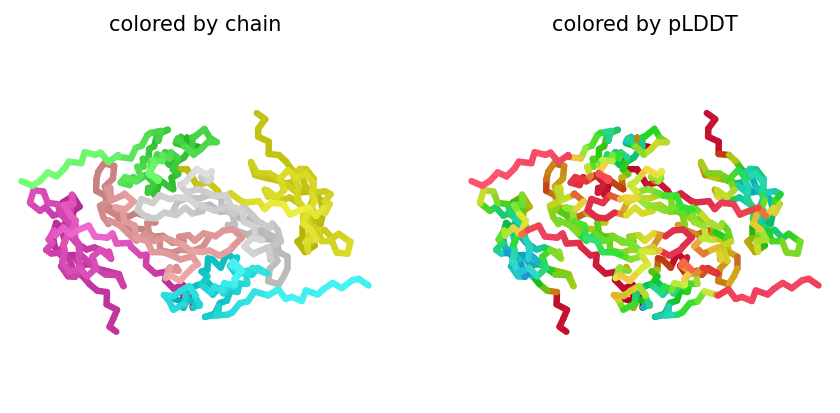

2024-11-06 22:23:19,901 alphafold2_multimer_v3_model_2_seed_005 recycle=0 pLDDT=61.7 pTM=0.522 ipTM=0.453
2024-11-06 22:23:19,902 alphafold2_multimer_v3_model_2_seed_005 took 9.5s (0 recycles)


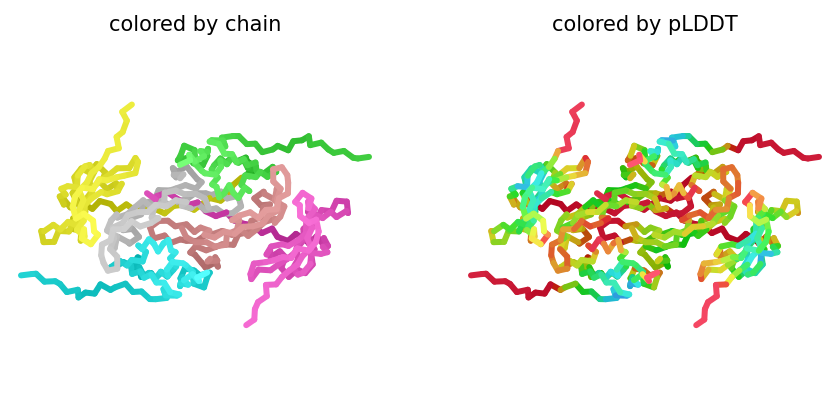

2024-11-06 22:23:30,102 alphafold2_multimer_v3_model_3_seed_005 recycle=0 pLDDT=59.4 pTM=0.431 ipTM=0.352
2024-11-06 22:23:30,103 alphafold2_multimer_v3_model_3_seed_005 took 9.5s (0 recycles)


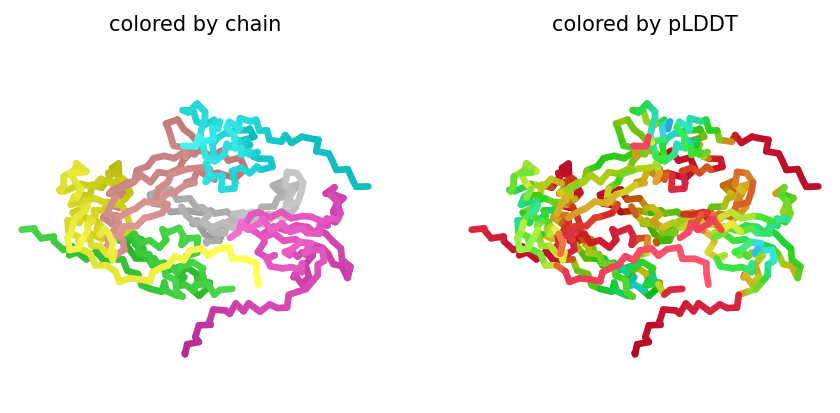

2024-11-06 22:23:40,307 alphafold2_multimer_v3_model_4_seed_005 recycle=0 pLDDT=60.3 pTM=0.371 ipTM=0.279
2024-11-06 22:23:40,309 alphafold2_multimer_v3_model_4_seed_005 took 9.5s (0 recycles)


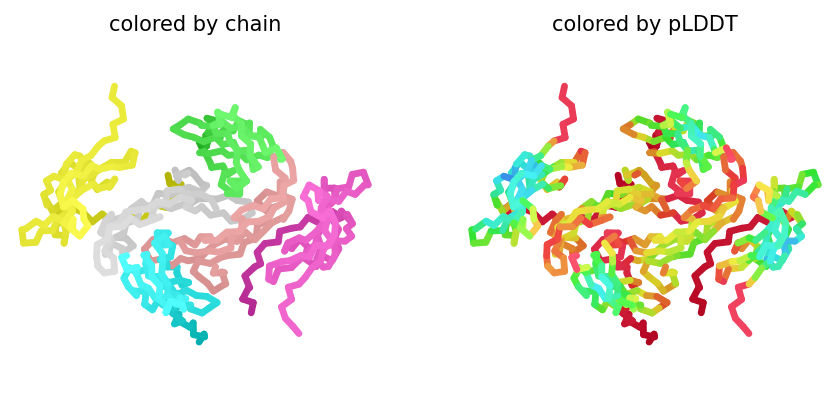

2024-11-06 22:23:50,478 alphafold2_multimer_v3_model_5_seed_005 recycle=0 pLDDT=63.9 pTM=0.716 ipTM=0.678
2024-11-06 22:23:50,480 alphafold2_multimer_v3_model_5_seed_005 took 9.5s (0 recycles)


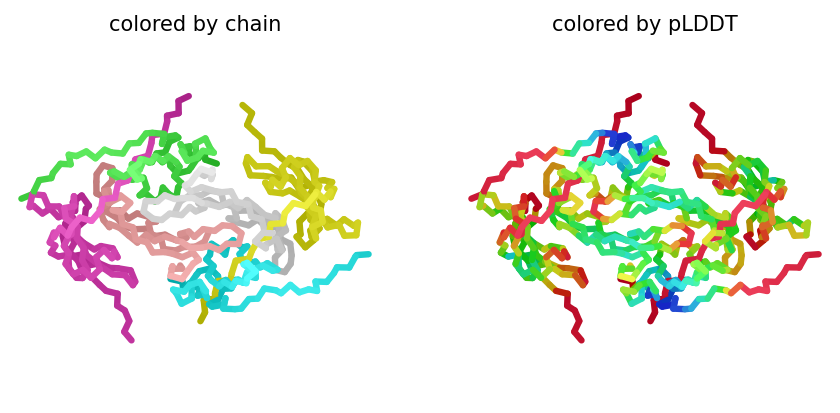

2024-11-06 22:24:00,656 alphafold2_multimer_v3_model_1_seed_006 recycle=0 pLDDT=61.8 pTM=0.438 ipTM=0.357
2024-11-06 22:24:00,657 alphafold2_multimer_v3_model_1_seed_006 took 9.5s (0 recycles)


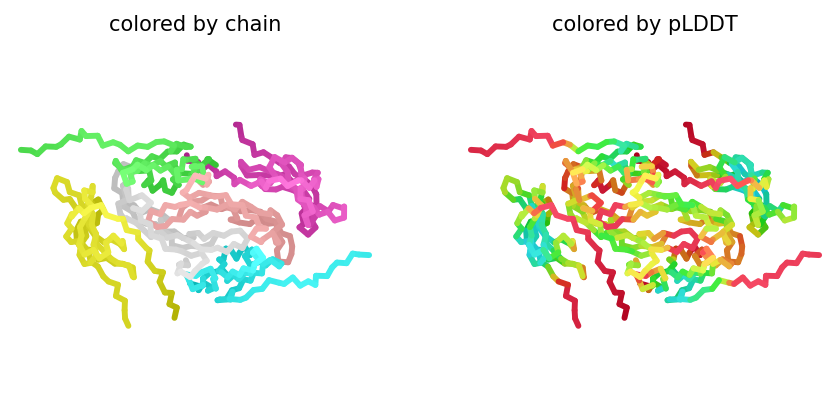

2024-11-06 22:24:10,857 alphafold2_multimer_v3_model_2_seed_006 recycle=0 pLDDT=58.8 pTM=0.392 ipTM=0.299
2024-11-06 22:24:10,859 alphafold2_multimer_v3_model_2_seed_006 took 9.5s (0 recycles)


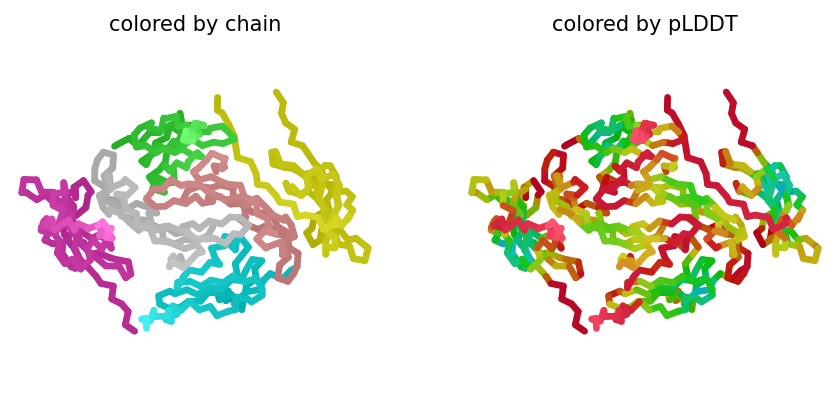

2024-11-06 22:24:21,022 alphafold2_multimer_v3_model_3_seed_006 recycle=0 pLDDT=62.1 pTM=0.621 ipTM=0.567
2024-11-06 22:24:21,024 alphafold2_multimer_v3_model_3_seed_006 took 9.5s (0 recycles)


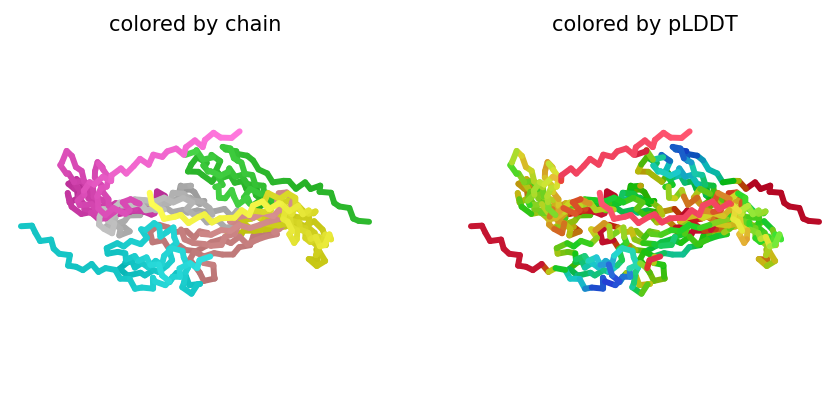

2024-11-06 22:24:31,198 alphafold2_multimer_v3_model_4_seed_006 recycle=0 pLDDT=69.8 pTM=0.418 ipTM=0.331
2024-11-06 22:24:31,200 alphafold2_multimer_v3_model_4_seed_006 took 9.5s (0 recycles)


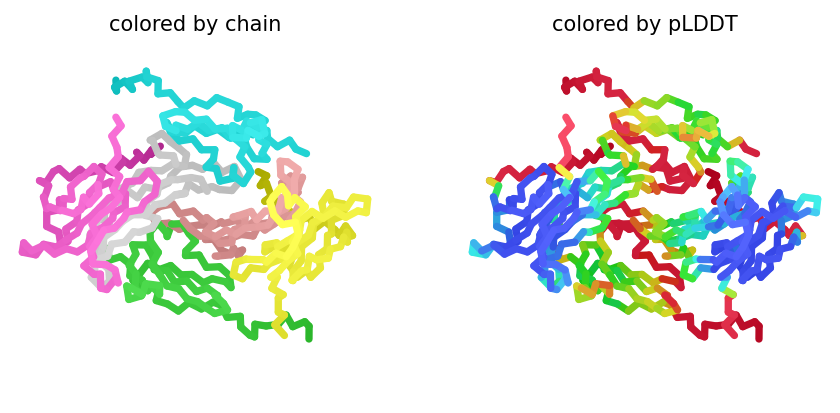

2024-11-06 22:24:41,403 alphafold2_multimer_v3_model_5_seed_006 recycle=0 pLDDT=62 pTM=0.635 ipTM=0.583
2024-11-06 22:24:41,405 alphafold2_multimer_v3_model_5_seed_006 took 9.5s (0 recycles)


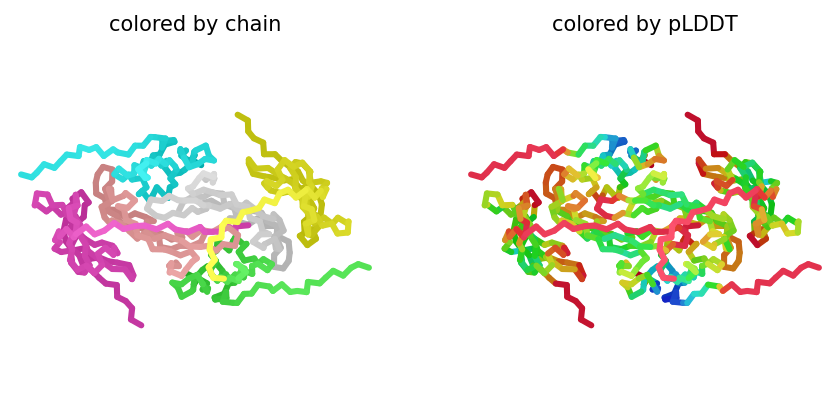

2024-11-06 22:24:51,593 alphafold2_multimer_v3_model_1_seed_007 recycle=0 pLDDT=71.6 pTM=0.498 ipTM=0.422
2024-11-06 22:24:51,594 alphafold2_multimer_v3_model_1_seed_007 took 9.5s (0 recycles)


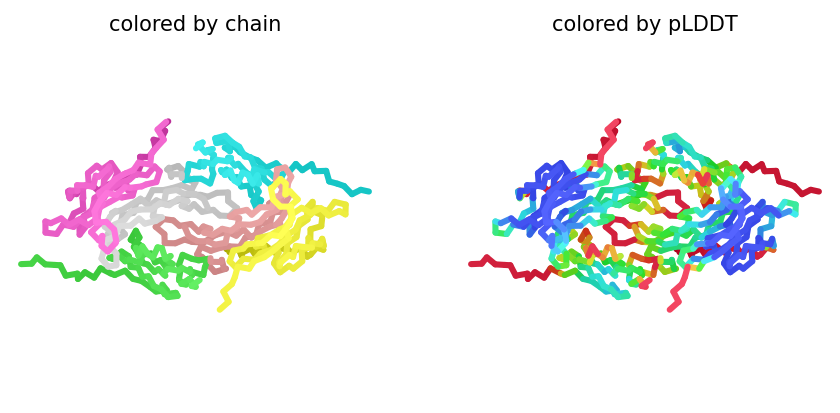

2024-11-06 22:25:01,766 alphafold2_multimer_v3_model_2_seed_007 recycle=0 pLDDT=74.7 pTM=0.61 ipTM=0.555
2024-11-06 22:25:01,767 alphafold2_multimer_v3_model_2_seed_007 took 9.5s (0 recycles)


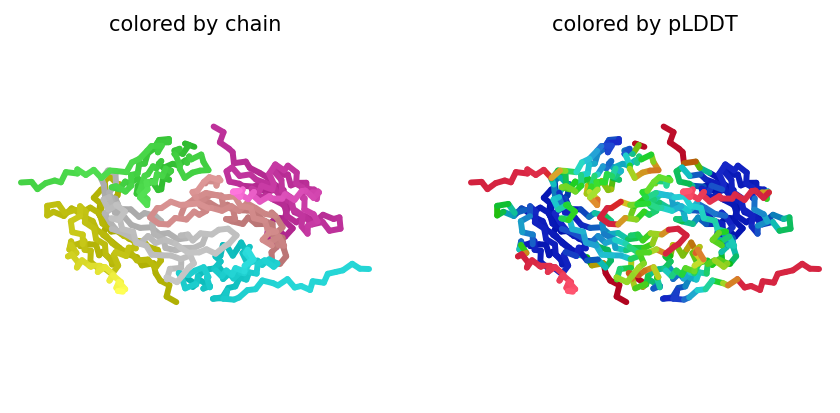

2024-11-06 22:25:11,929 alphafold2_multimer_v3_model_3_seed_007 recycle=0 pLDDT=62.6 pTM=0.602 ipTM=0.544
2024-11-06 22:25:11,931 alphafold2_multimer_v3_model_3_seed_007 took 9.5s (0 recycles)


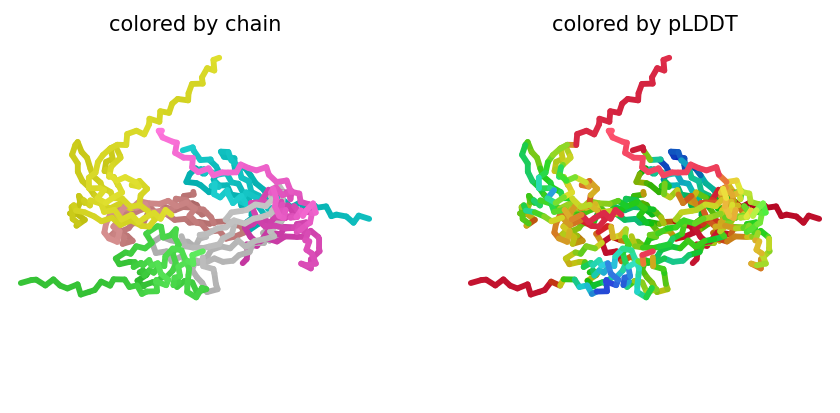

2024-11-06 22:25:22,129 alphafold2_multimer_v3_model_4_seed_007 recycle=0 pLDDT=59.3 pTM=0.388 ipTM=0.297
2024-11-06 22:25:22,131 alphafold2_multimer_v3_model_4_seed_007 took 9.5s (0 recycles)


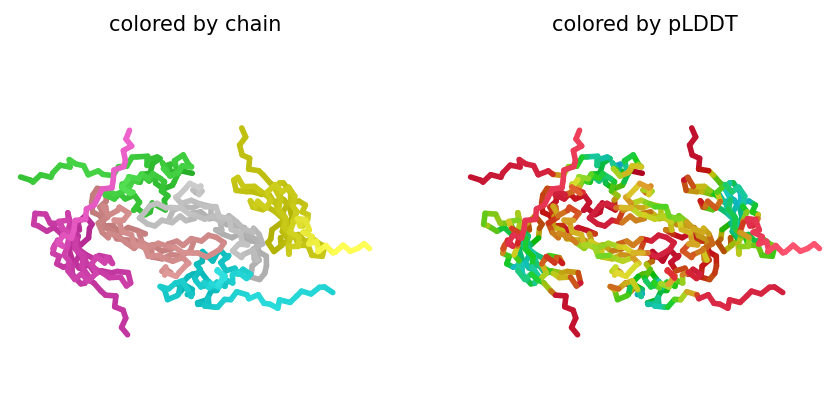

2024-11-06 22:25:32,312 alphafold2_multimer_v3_model_5_seed_007 recycle=0 pLDDT=61 pTM=0.625 ipTM=0.57
2024-11-06 22:25:32,313 alphafold2_multimer_v3_model_5_seed_007 took 9.5s (0 recycles)


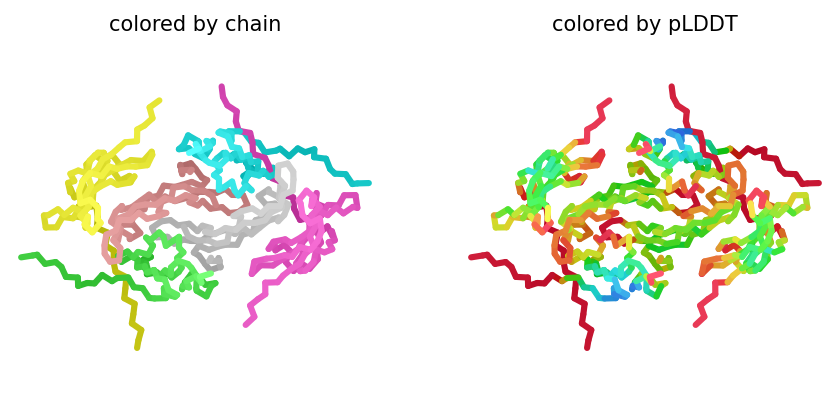

2024-11-06 22:25:42,490 alphafold2_multimer_v3_model_1_seed_008 recycle=0 pLDDT=63.5 pTM=0.532 ipTM=0.462
2024-11-06 22:25:42,491 alphafold2_multimer_v3_model_1_seed_008 took 9.5s (0 recycles)


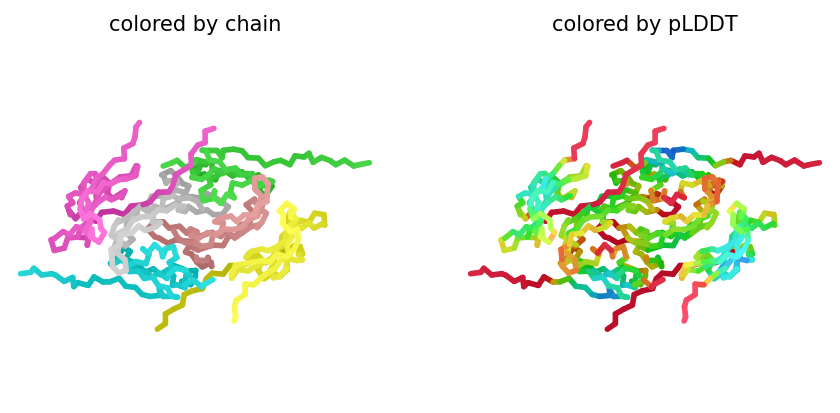

2024-11-06 22:25:52,665 alphafold2_multimer_v3_model_2_seed_008 recycle=0 pLDDT=63.3 pTM=0.587 ipTM=0.526
2024-11-06 22:25:52,667 alphafold2_multimer_v3_model_2_seed_008 took 9.5s (0 recycles)


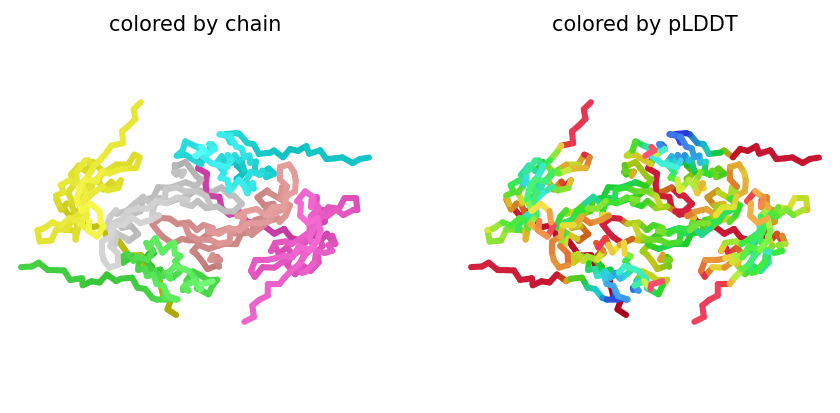

2024-11-06 22:26:02,843 alphafold2_multimer_v3_model_3_seed_008 recycle=0 pLDDT=61.3 pTM=0.512 ipTM=0.443
2024-11-06 22:26:02,844 alphafold2_multimer_v3_model_3_seed_008 took 9.5s (0 recycles)


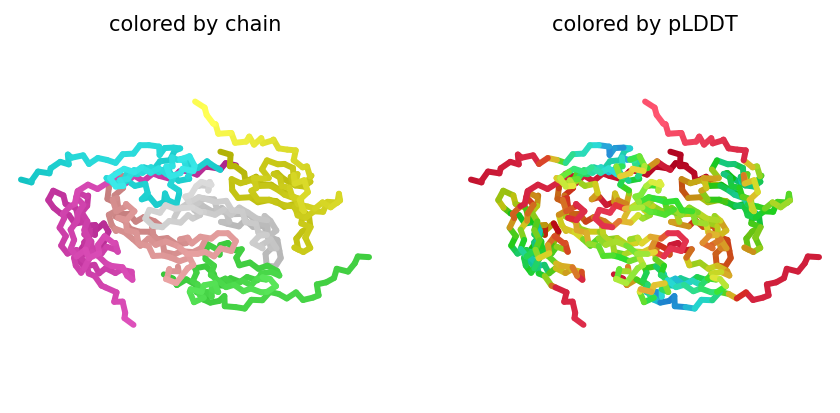

2024-11-06 22:26:13,056 alphafold2_multimer_v3_model_4_seed_008 recycle=0 pLDDT=61.5 pTM=0.331 ipTM=0.227
2024-11-06 22:26:13,057 alphafold2_multimer_v3_model_4_seed_008 took 9.5s (0 recycles)


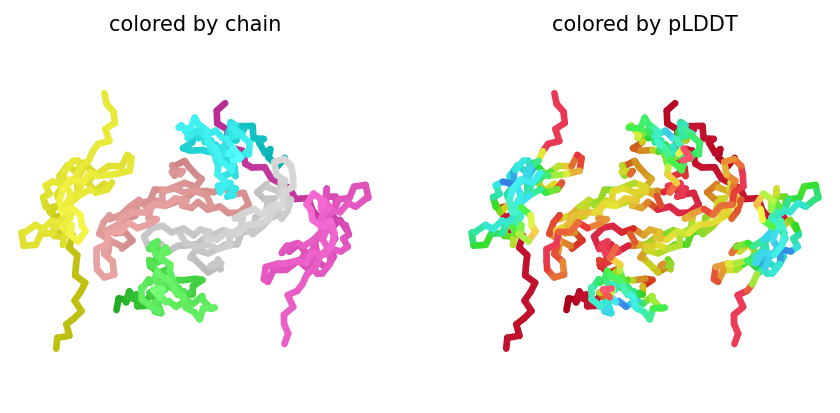

2024-11-06 22:26:23,223 alphafold2_multimer_v3_model_5_seed_008 recycle=0 pLDDT=62.1 pTM=0.644 ipTM=0.594
2024-11-06 22:26:23,224 alphafold2_multimer_v3_model_5_seed_008 took 9.5s (0 recycles)


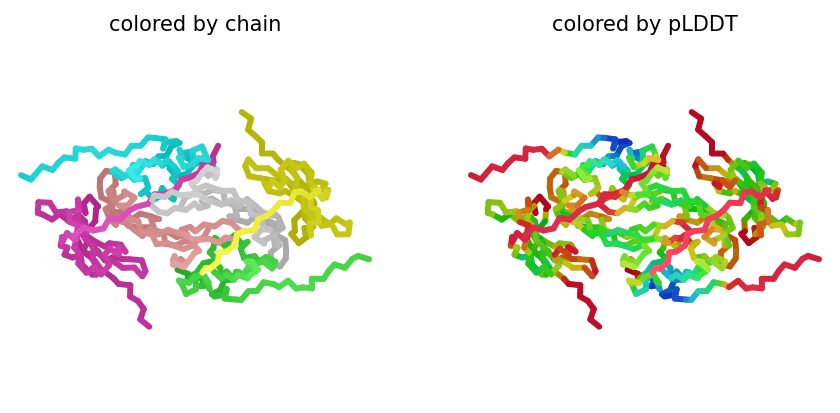

2024-11-06 22:26:33,425 alphafold2_multimer_v3_model_1_seed_009 recycle=0 pLDDT=63.2 pTM=0.347 ipTM=0.248
2024-11-06 22:26:33,427 alphafold2_multimer_v3_model_1_seed_009 took 9.5s (0 recycles)


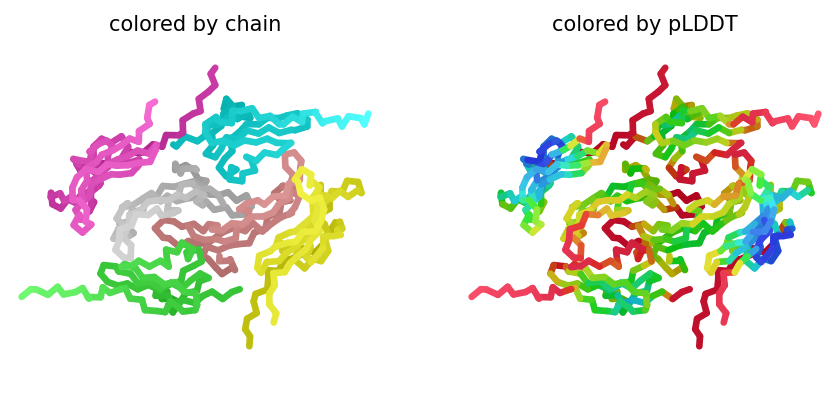

2024-11-06 22:26:43,633 alphafold2_multimer_v3_model_2_seed_009 recycle=0 pLDDT=72.9 pTM=0.544 ipTM=0.478
2024-11-06 22:26:43,635 alphafold2_multimer_v3_model_2_seed_009 took 9.5s (0 recycles)


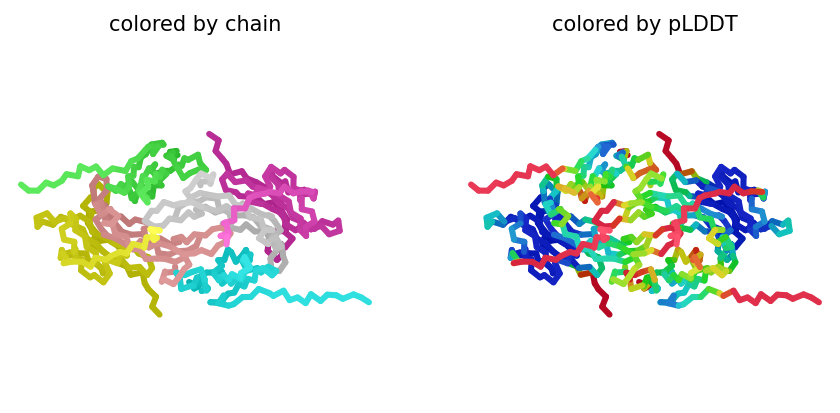

2024-11-06 22:26:53,801 alphafold2_multimer_v3_model_3_seed_009 recycle=0 pLDDT=62.9 pTM=0.67 ipTM=0.624
2024-11-06 22:26:53,803 alphafold2_multimer_v3_model_3_seed_009 took 9.5s (0 recycles)


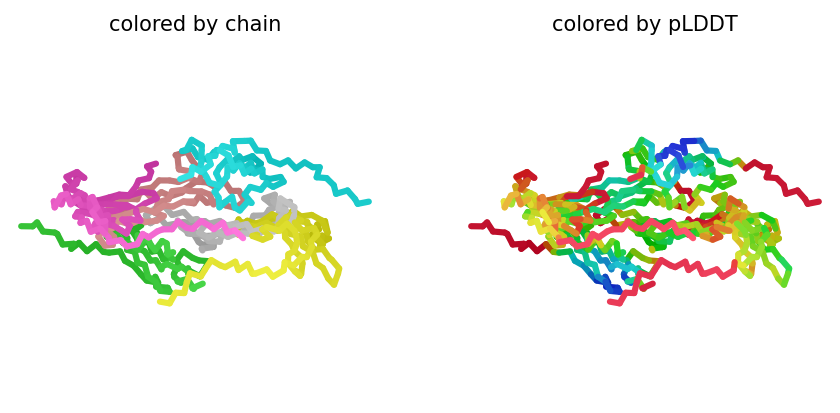

2024-11-06 22:27:03,964 alphafold2_multimer_v3_model_4_seed_009 recycle=0 pLDDT=75.1 pTM=0.583 ipTM=0.524
2024-11-06 22:27:03,966 alphafold2_multimer_v3_model_4_seed_009 took 9.5s (0 recycles)


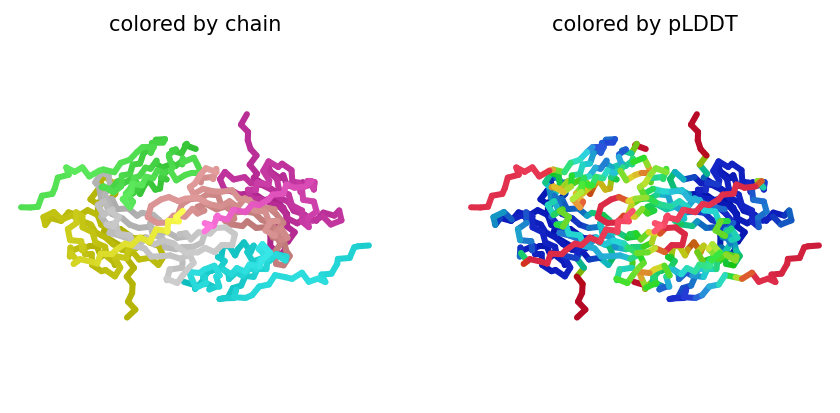

2024-11-06 22:27:14,119 alphafold2_multimer_v3_model_5_seed_009 recycle=0 pLDDT=60.7 pTM=0.631 ipTM=0.579
2024-11-06 22:27:14,120 alphafold2_multimer_v3_model_5_seed_009 took 9.5s (0 recycles)


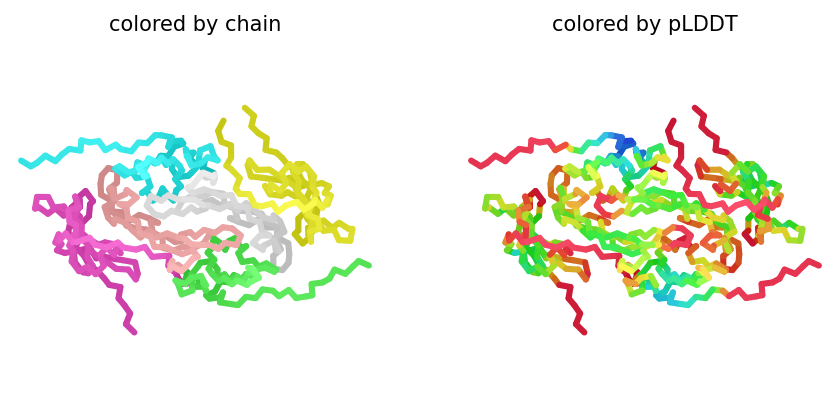

2024-11-06 22:27:24,310 alphafold2_multimer_v3_model_1_seed_010 recycle=0 pLDDT=64.3 pTM=0.501 ipTM=0.426
2024-11-06 22:27:24,311 alphafold2_multimer_v3_model_1_seed_010 took 9.5s (0 recycles)


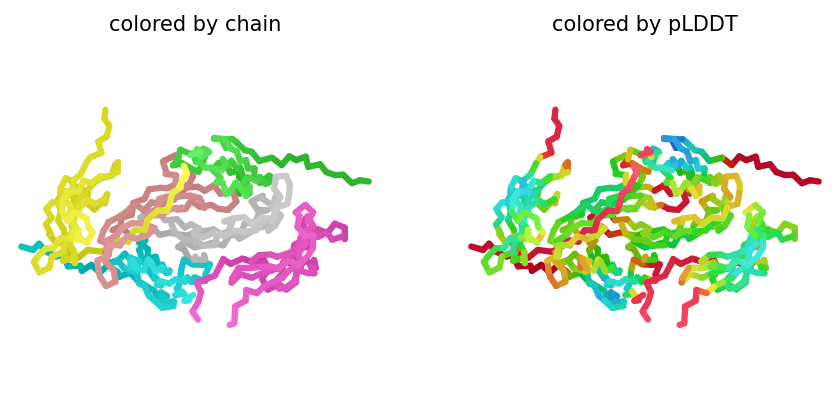

2024-11-06 22:27:34,469 alphafold2_multimer_v3_model_2_seed_010 recycle=0 pLDDT=73.2 pTM=0.556 ipTM=0.492
2024-11-06 22:27:34,471 alphafold2_multimer_v3_model_2_seed_010 took 9.5s (0 recycles)


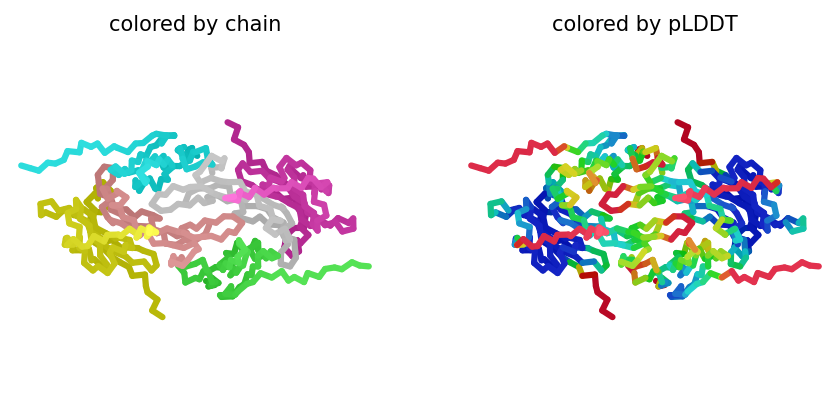

2024-11-06 22:27:44,649 alphafold2_multimer_v3_model_3_seed_010 recycle=0 pLDDT=62.5 pTM=0.538 ipTM=0.475
2024-11-06 22:27:44,650 alphafold2_multimer_v3_model_3_seed_010 took 9.5s (0 recycles)


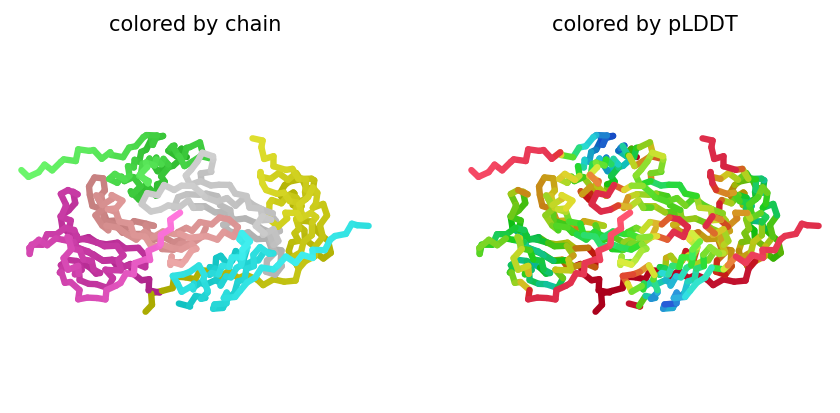

2024-11-06 22:27:54,831 alphafold2_multimer_v3_model_4_seed_010 recycle=0 pLDDT=61.8 pTM=0.488 ipTM=0.415
2024-11-06 22:27:54,832 alphafold2_multimer_v3_model_4_seed_010 took 9.5s (0 recycles)


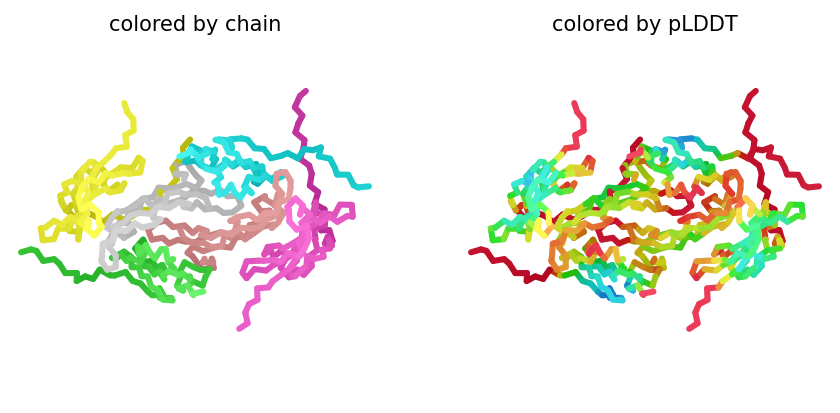

2024-11-06 22:28:05,028 alphafold2_multimer_v3_model_5_seed_010 recycle=0 pLDDT=64.3 pTM=0.691 ipTM=0.648
2024-11-06 22:28:05,030 alphafold2_multimer_v3_model_5_seed_010 took 9.5s (0 recycles)


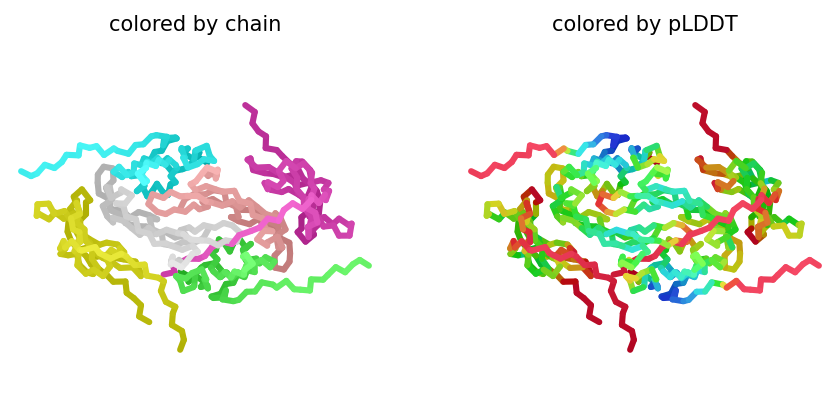

2024-11-06 22:28:15,228 alphafold2_multimer_v3_model_1_seed_011 recycle=0 pLDDT=72.4 pTM=0.499 ipTM=0.425
2024-11-06 22:28:15,230 alphafold2_multimer_v3_model_1_seed_011 took 9.5s (0 recycles)


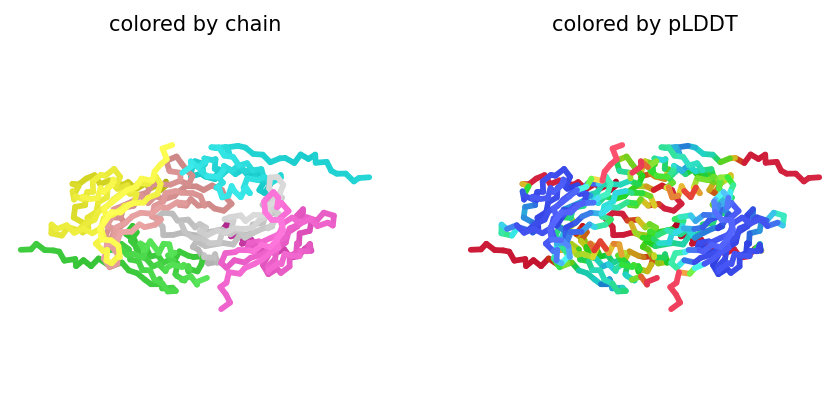

2024-11-06 22:28:25,410 alphafold2_multimer_v3_model_2_seed_011 recycle=0 pLDDT=74.4 pTM=0.627 ipTM=0.572
2024-11-06 22:28:25,412 alphafold2_multimer_v3_model_2_seed_011 took 9.5s (0 recycles)


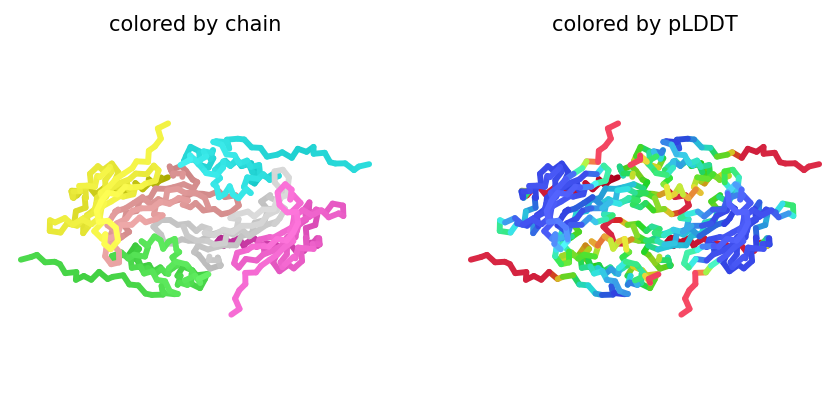

2024-11-06 22:28:35,622 alphafold2_multimer_v3_model_3_seed_011 recycle=0 pLDDT=60.6 pTM=0.367 ipTM=0.271
2024-11-06 22:28:35,623 alphafold2_multimer_v3_model_3_seed_011 took 9.5s (0 recycles)


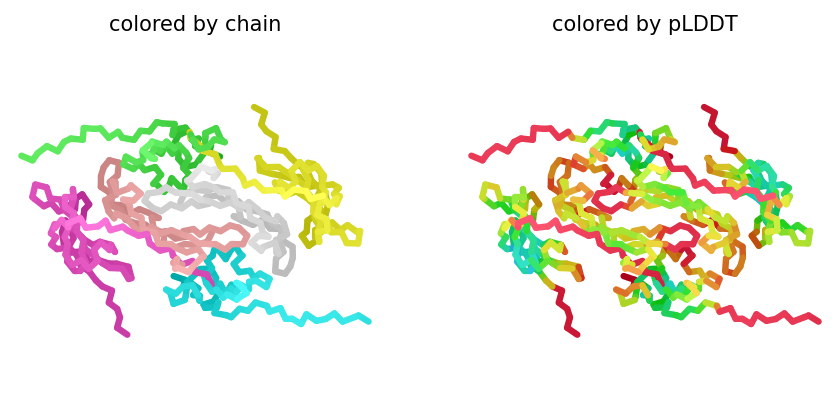

2024-11-06 22:28:45,826 alphafold2_multimer_v3_model_4_seed_011 recycle=0 pLDDT=76.3 pTM=0.637 ipTM=0.585
2024-11-06 22:28:45,828 alphafold2_multimer_v3_model_4_seed_011 took 9.5s (0 recycles)


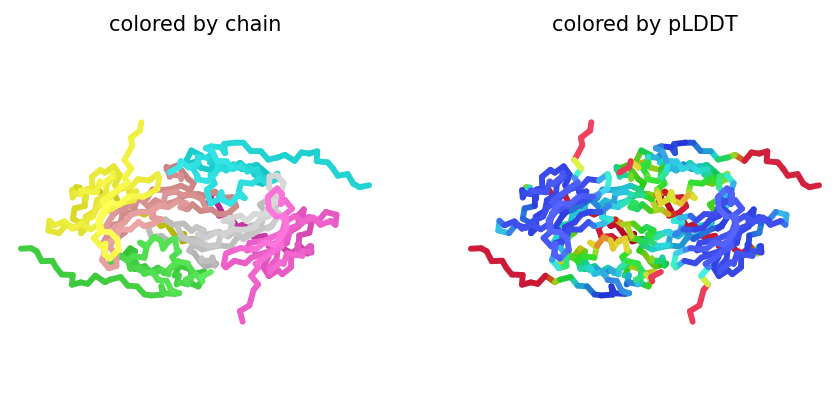

2024-11-06 22:28:55,990 alphafold2_multimer_v3_model_5_seed_011 recycle=0 pLDDT=63 pTM=0.656 ipTM=0.61
2024-11-06 22:28:55,991 alphafold2_multimer_v3_model_5_seed_011 took 9.5s (0 recycles)


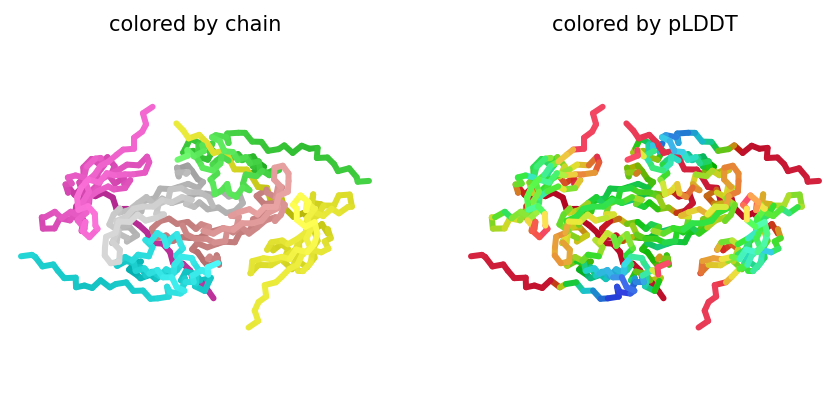

2024-11-06 22:29:06,195 alphafold2_multimer_v3_model_1_seed_012 recycle=0 pLDDT=64 pTM=0.408 ipTM=0.323
2024-11-06 22:29:06,197 alphafold2_multimer_v3_model_1_seed_012 took 9.5s (0 recycles)


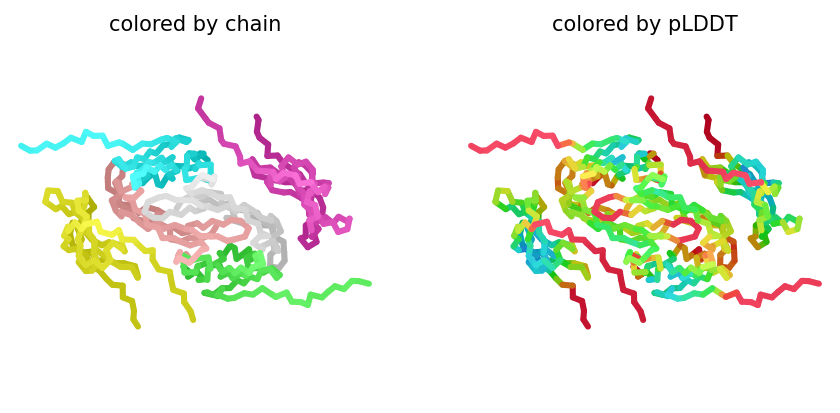

2024-11-06 22:29:16,367 alphafold2_multimer_v3_model_2_seed_012 recycle=0 pLDDT=74.7 pTM=0.558 ipTM=0.494
2024-11-06 22:29:16,369 alphafold2_multimer_v3_model_2_seed_012 took 9.5s (0 recycles)


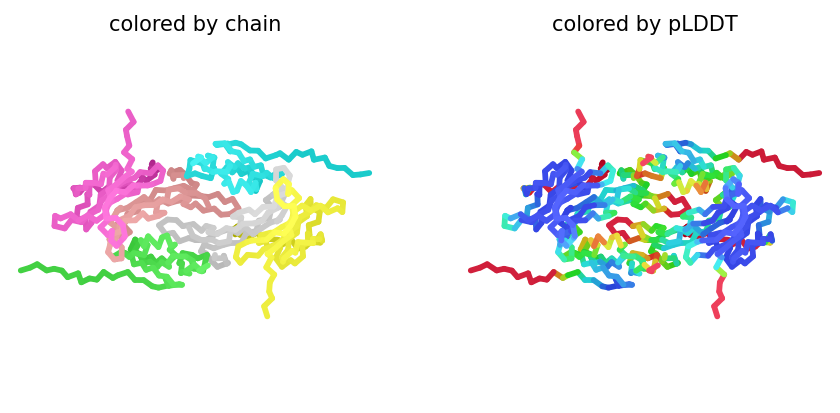

2024-11-06 22:29:26,526 alphafold2_multimer_v3_model_3_seed_012 recycle=0 pLDDT=60.7 pTM=0.453 ipTM=0.373
2024-11-06 22:29:26,528 alphafold2_multimer_v3_model_3_seed_012 took 9.5s (0 recycles)


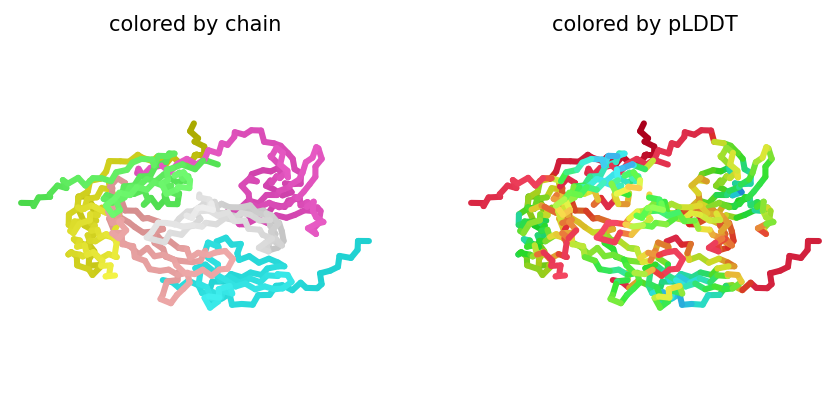

2024-11-06 22:29:36,703 alphafold2_multimer_v3_model_4_seed_012 recycle=0 pLDDT=60.9 pTM=0.429 ipTM=0.344
2024-11-06 22:29:36,705 alphafold2_multimer_v3_model_4_seed_012 took 9.5s (0 recycles)


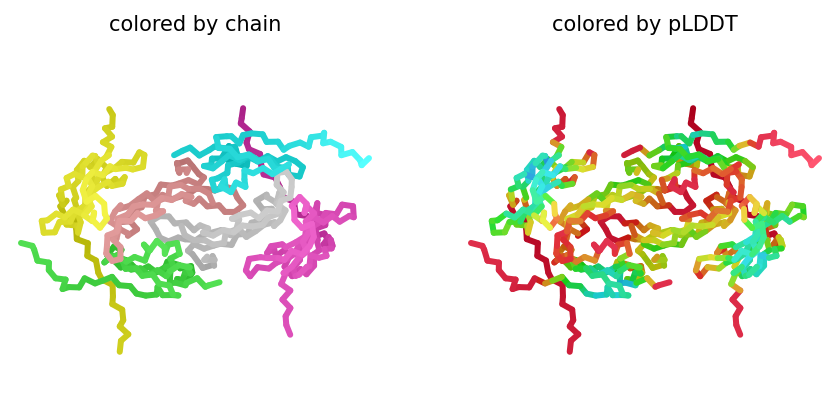

2024-11-06 22:29:46,919 alphafold2_multimer_v3_model_5_seed_012 recycle=0 pLDDT=61.7 pTM=0.639 ipTM=0.589
2024-11-06 22:29:46,921 alphafold2_multimer_v3_model_5_seed_012 took 9.5s (0 recycles)


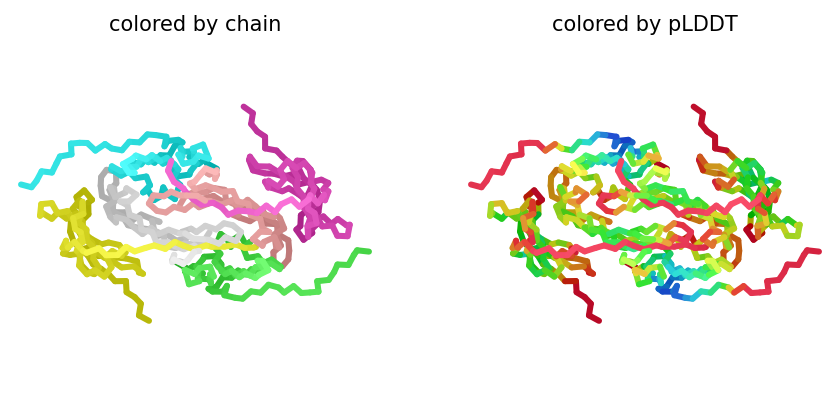

2024-11-06 22:29:57,135 alphafold2_multimer_v3_model_1_seed_013 recycle=0 pLDDT=63.5 pTM=0.327 ipTM=0.222
2024-11-06 22:29:57,137 alphafold2_multimer_v3_model_1_seed_013 took 9.5s (0 recycles)


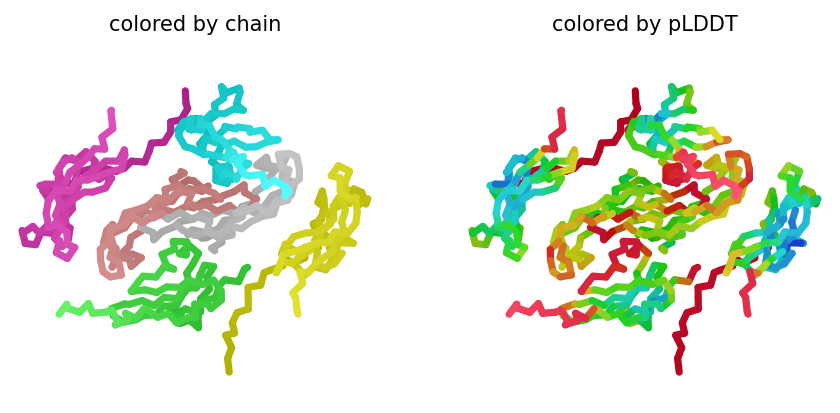

2024-11-06 22:30:07,307 alphafold2_multimer_v3_model_2_seed_013 recycle=0 pLDDT=64.9 pTM=0.593 ipTM=0.533
2024-11-06 22:30:07,308 alphafold2_multimer_v3_model_2_seed_013 took 9.5s (0 recycles)


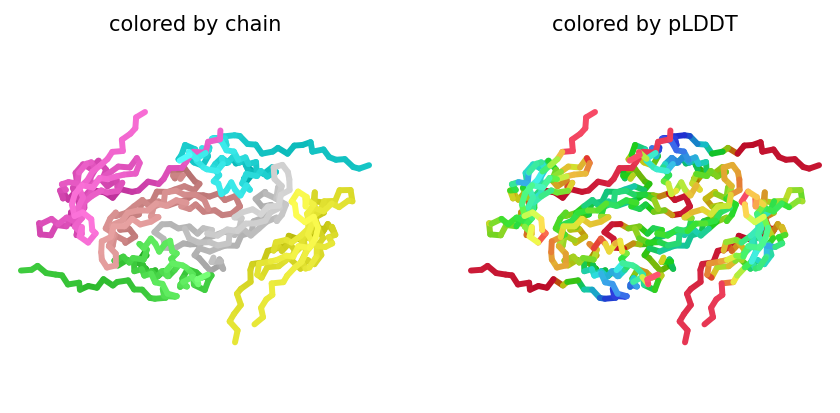

2024-11-06 22:30:17,460 alphafold2_multimer_v3_model_3_seed_013 recycle=0 pLDDT=60 pTM=0.482 ipTM=0.412
2024-11-06 22:30:17,462 alphafold2_multimer_v3_model_3_seed_013 took 9.5s (0 recycles)


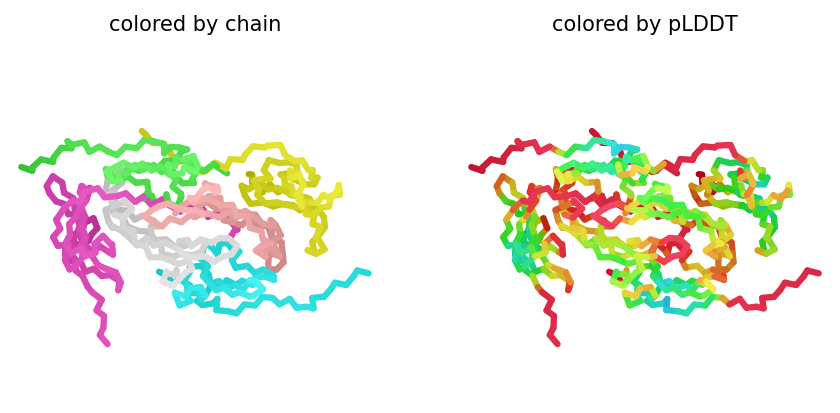

2024-11-06 22:30:27,632 alphafold2_multimer_v3_model_4_seed_013 recycle=0 pLDDT=62.1 pTM=0.493 ipTM=0.42
2024-11-06 22:30:27,634 alphafold2_multimer_v3_model_4_seed_013 took 9.5s (0 recycles)


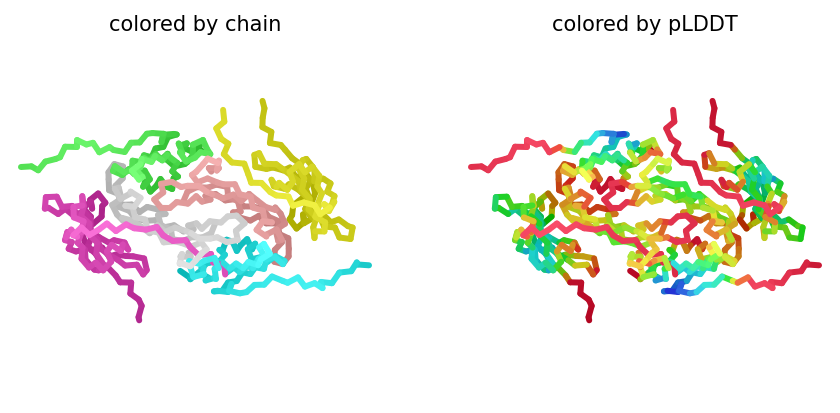

2024-11-06 22:30:37,808 alphafold2_multimer_v3_model_5_seed_013 recycle=0 pLDDT=61.7 pTM=0.642 ipTM=0.59
2024-11-06 22:30:37,810 alphafold2_multimer_v3_model_5_seed_013 took 9.5s (0 recycles)


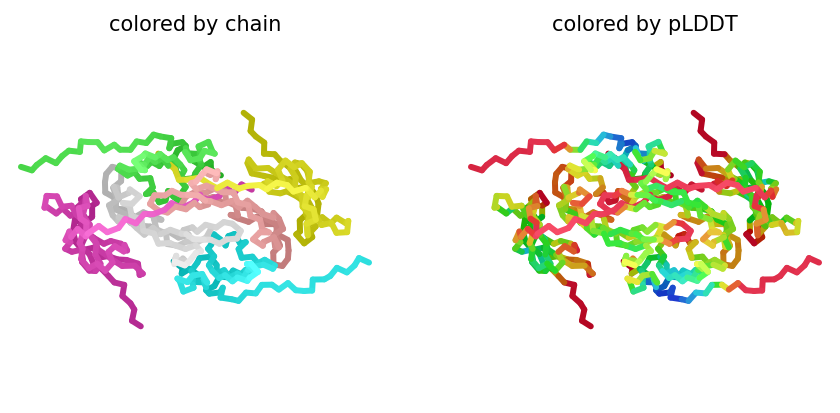

2024-11-06 22:30:48,008 alphafold2_multimer_v3_model_1_seed_014 recycle=0 pLDDT=62.8 pTM=0.451 ipTM=0.368
2024-11-06 22:30:48,009 alphafold2_multimer_v3_model_1_seed_014 took 9.5s (0 recycles)


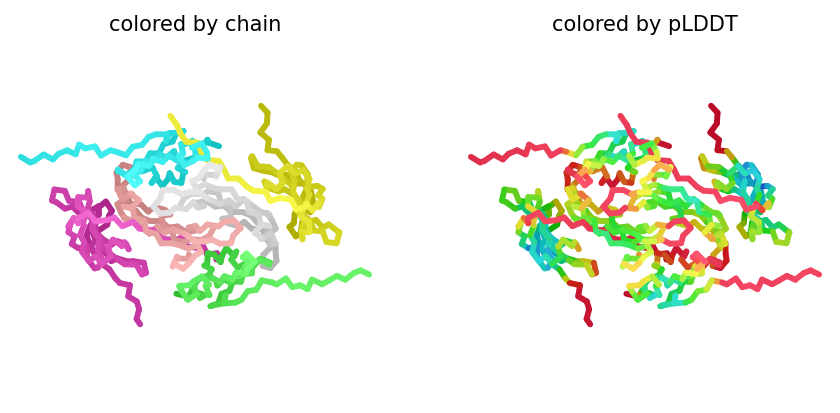

2024-11-06 22:30:58,177 alphafold2_multimer_v3_model_2_seed_014 recycle=0 pLDDT=60.6 pTM=0.436 ipTM=0.35
2024-11-06 22:30:58,179 alphafold2_multimer_v3_model_2_seed_014 took 9.5s (0 recycles)


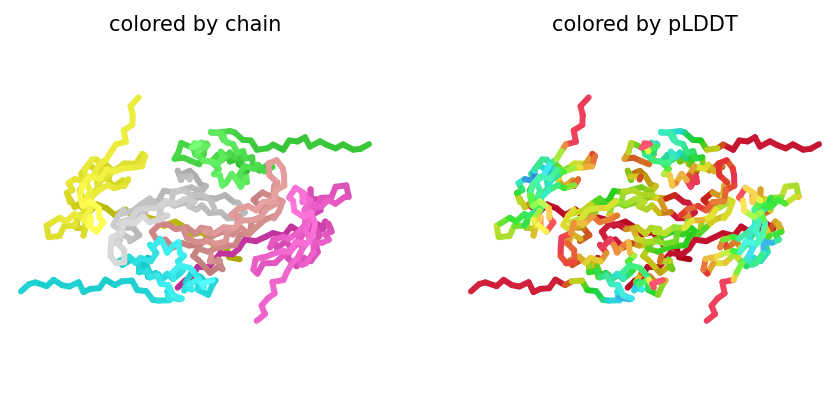

2024-11-06 22:31:08,356 alphafold2_multimer_v3_model_3_seed_014 recycle=0 pLDDT=61.2 pTM=0.409 ipTM=0.321
2024-11-06 22:31:08,358 alphafold2_multimer_v3_model_3_seed_014 took 9.5s (0 recycles)


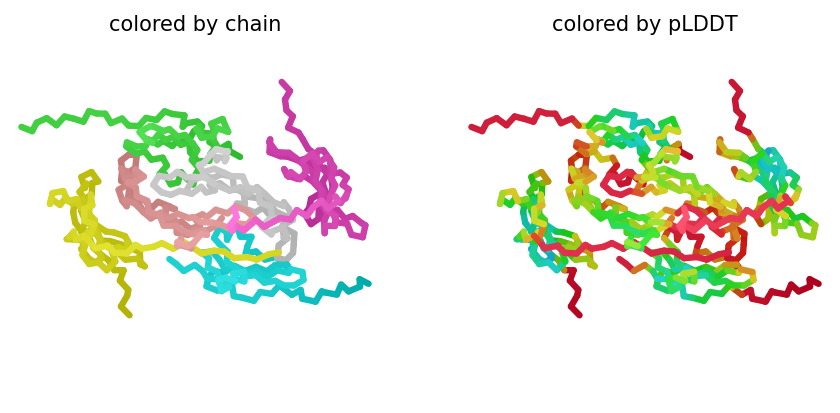

2024-11-06 22:31:18,569 alphafold2_multimer_v3_model_4_seed_014 recycle=0 pLDDT=62 pTM=0.299 ipTM=0.184
2024-11-06 22:31:18,571 alphafold2_multimer_v3_model_4_seed_014 took 9.5s (0 recycles)


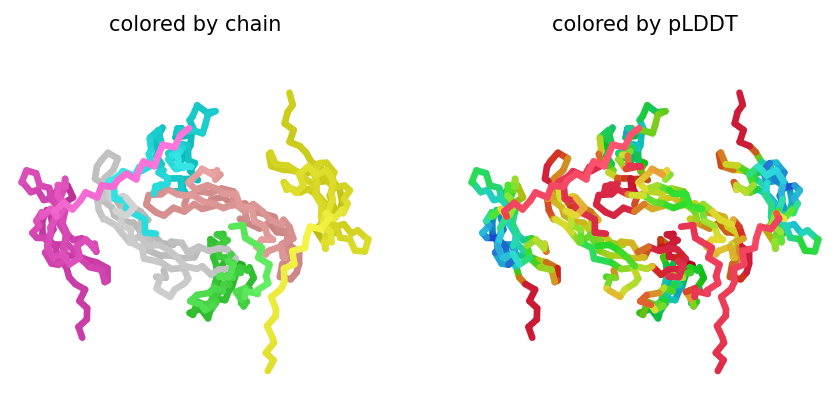

2024-11-06 22:31:28,770 alphafold2_multimer_v3_model_5_seed_014 recycle=0 pLDDT=60.2 pTM=0.595 ipTM=0.538
2024-11-06 22:31:28,772 alphafold2_multimer_v3_model_5_seed_014 took 9.5s (0 recycles)


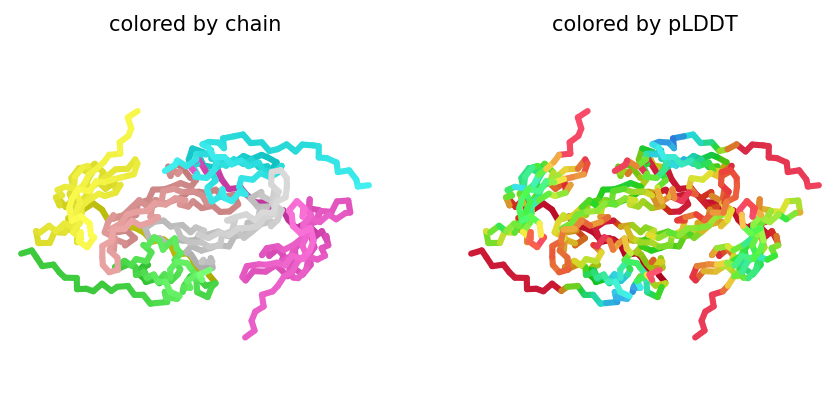

2024-11-06 22:31:38,960 alphafold2_multimer_v3_model_1_seed_015 recycle=0 pLDDT=62.4 pTM=0.5 ipTM=0.423
2024-11-06 22:31:38,962 alphafold2_multimer_v3_model_1_seed_015 took 9.5s (0 recycles)


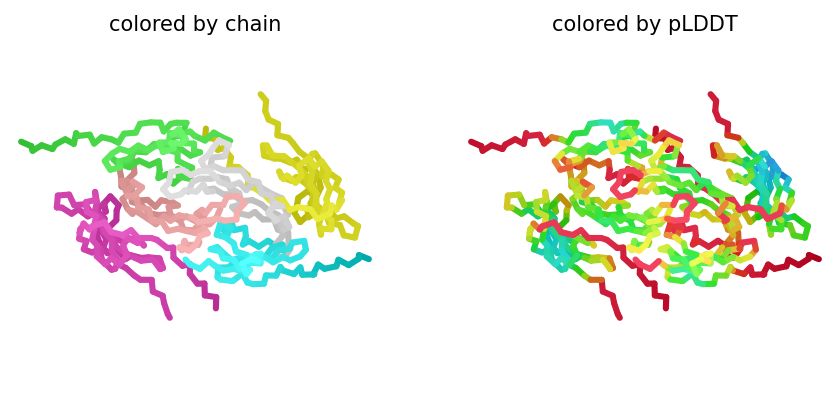

2024-11-06 22:31:50,290 alphafold2_multimer_v3_model_2_seed_015 recycle=0 pLDDT=75.9 pTM=0.645 ipTM=0.596
2024-11-06 22:31:50,292 alphafold2_multimer_v3_model_2_seed_015 took 9.5s (0 recycles)


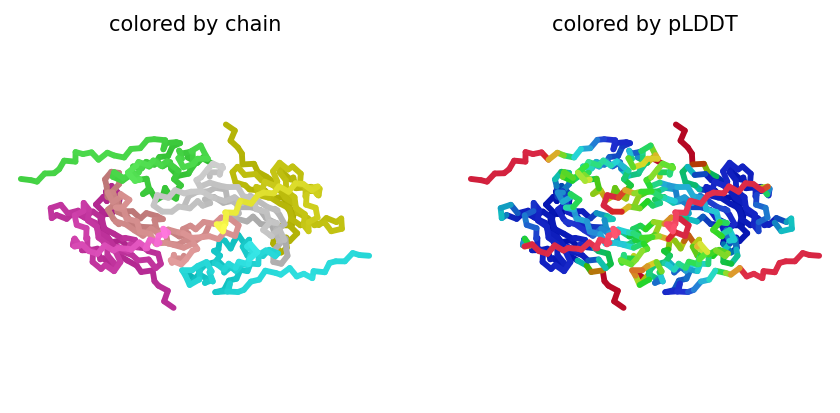

2024-11-06 22:32:00,483 alphafold2_multimer_v3_model_3_seed_015 recycle=0 pLDDT=60.8 pTM=0.351 ipTM=0.251
2024-11-06 22:32:00,485 alphafold2_multimer_v3_model_3_seed_015 took 9.5s (0 recycles)


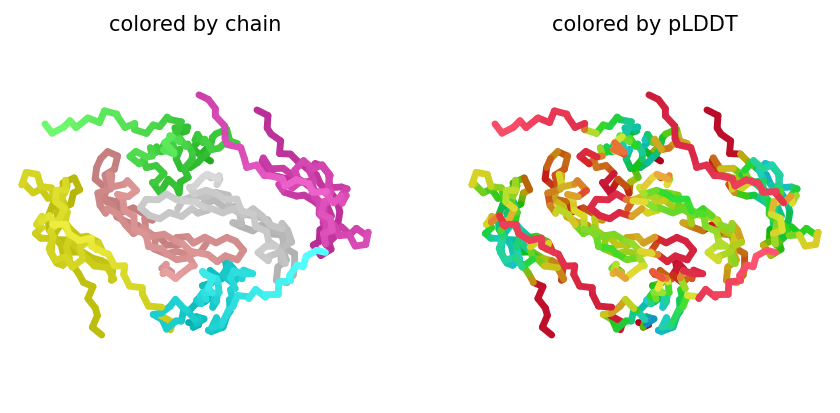

2024-11-06 22:32:10,671 alphafold2_multimer_v3_model_4_seed_015 recycle=0 pLDDT=61.8 pTM=0.432 ipTM=0.348
2024-11-06 22:32:10,673 alphafold2_multimer_v3_model_4_seed_015 took 9.5s (0 recycles)


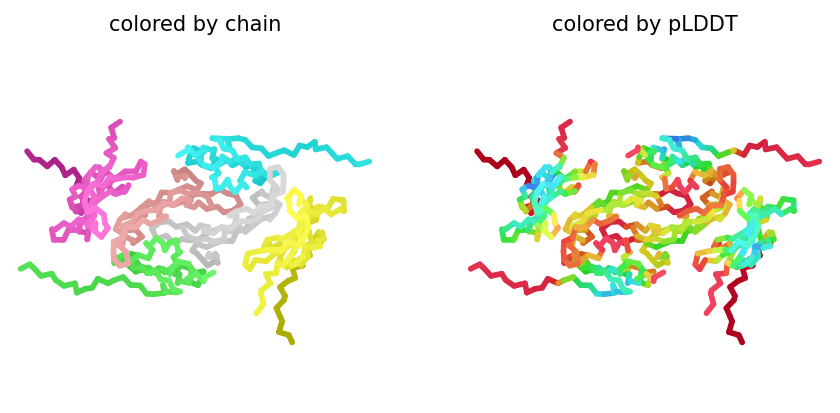

2024-11-06 22:32:20,903 alphafold2_multimer_v3_model_5_seed_015 recycle=0 pLDDT=60.1 pTM=0.533 ipTM=0.468
2024-11-06 22:32:20,904 alphafold2_multimer_v3_model_5_seed_015 took 9.5s (0 recycles)


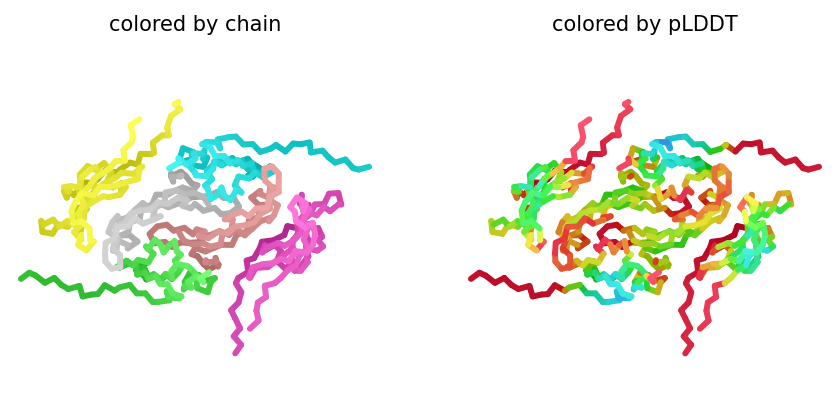

2024-11-06 22:32:21,601 reranking models by 'multimer' metric
2024-11-06 22:36:07,012 Relaxation took 225.4s
2024-11-06 22:36:07,013 rank_001_alphafold2_multimer_v3_model_5_seed_000 pLDDT=76.9 pTM=0.726 ipTM=0.688
2024-11-06 22:36:07,014 rank_002_alphafold2_multimer_v3_model_5_seed_001 pLDDT=78 pTM=0.72 ipTM=0.681
2024-11-06 22:36:07,014 rank_003_alphafold2_multimer_v3_model_5_seed_005 pLDDT=63.9 pTM=0.716 ipTM=0.678
2024-11-06 22:36:07,015 rank_004_alphafold2_multimer_v3_model_5_seed_010 pLDDT=64.3 pTM=0.691 ipTM=0.648
2024-11-06 22:36:07,015 rank_005_alphafold2_multimer_v3_model_5_seed_004 pLDDT=62.9 pTM=0.685 ipTM=0.641
2024-11-06 22:36:07,016 rank_006_alphafold2_multimer_v3_model_3_seed_009 pLDDT=62.9 pTM=0.67 ipTM=0.624
2024-11-06 22:36:07,016 rank_007_alphafold2_multimer_v3_model_5_seed_011 pLDDT=63 pTM=0.656 ipTM=0.61
2024-11-06 22:36:07,016 rank_008_alphafold2_multimer_v3_model_2_seed_015 pLDDT=75.9 pTM=0.645 ipTM=0.596
2024-11-06 22:36:07,017 rank_009_alphafold2_multimer_v3_mo

0

In [21]:
#@title Run Prediction
display_images = True #@param {type:"boolean"}

import sys
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from Bio import BiopythonDeprecationWarning
warnings.simplefilter(action='ignore', category=BiopythonDeprecationWarning)
from pathlib import Path
from colabfold.download import download_alphafold_params, default_data_dir
from colabfold.utils import setup_logging
from colabfold.batch import get_queries, run, set_model_type
from colabfold.plot import plot_msa_v2

import os
import numpy as np
try:
  K80_chk = os.popen('nvidia-smi | grep "Tesla K80" | wc -l').read()
except:
  K80_chk = "0"
  pass
if "1" in K80_chk:
  print("WARNING: found GPU Tesla K80: limited to total length < 1000")
  if "TF_FORCE_UNIFIED_MEMORY" in os.environ:
    del os.environ["TF_FORCE_UNIFIED_MEMORY"]
  if "XLA_PYTHON_CLIENT_MEM_FRACTION" in os.environ:
    del os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"]

from colabfold.colabfold import plot_protein
from pathlib import Path
import matplotlib.pyplot as plt

# For some reason we need that to get pdbfixer to import
if use_amber and f"/usr/local/lib/python{python_version}/site-packages/" not in sys.path:
    sys.path.insert(0, f"/usr/local/lib/python{python_version}/site-packages/")

def input_features_callback(input_features):
  if display_images:
    plot_msa_v2(input_features)
    plt.show()
    plt.close()

def prediction_callback(protein_obj, length,
                        prediction_result, input_features, mode):
  model_name, relaxed = mode
  if not relaxed:
    if display_images:
      fig = plot_protein(protein_obj, Ls=length, dpi=150)
      plt.show()
      plt.close()

result_dir = jobname
log_filename = os.path.join(jobname,"log.txt")
setup_logging(Path(log_filename))

queries, is_complex = get_queries(queries_path)
model_type = set_model_type(is_complex, model_type)

if "multimer" in model_type and max_msa is not None:
  use_cluster_profile = False
else:
  use_cluster_profile = True

download_alphafold_params(model_type, Path("."))
results = run(
    queries=queries,
    result_dir=result_dir,
    use_templates=use_templates,
    custom_template_path=custom_template_path,
    num_relax=num_relax,
    msa_mode=msa_mode,
    model_type=model_type,
    num_models=5,
    num_recycles=num_recycles,
    relax_max_iterations=relax_max_iterations,
    recycle_early_stop_tolerance=recycle_early_stop_tolerance,
    num_seeds=num_seeds,
    use_dropout=use_dropout,
    model_order=[1,2,3,4,5],
    is_complex=is_complex,
    data_dir=Path("."),
    keep_existing_results=False,
    rank_by="auto",
    pair_mode=pair_mode,
    pairing_strategy=pairing_strategy,
    stop_at_score=float(100),
    prediction_callback=prediction_callback,
    dpi=dpi,
    zip_results=False,
    save_all=save_all,
    max_msa=max_msa,
    use_cluster_profile=use_cluster_profile,
    input_features_callback=input_features_callback,
    save_recycles=save_recycles,
    user_agent="colabfold/google-colab-main",
)
results_zip = f"{jobname}.result.zip"
os.system(f"zip -r {results_zip} {jobname}")

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

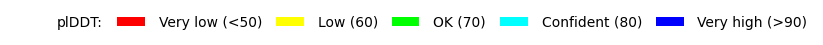

In [22]:
#@title Display 3D structure {run: "auto"}
import py3Dmol
import glob
import matplotlib.pyplot as plt
from colabfold.colabfold import plot_plddt_legend
from colabfold.colabfold import pymol_color_list, alphabet_list
rank_num = 1 #@param ["1", "2", "3", "4", "5"] {type:"raw"}
color = "lDDT" #@param ["chain", "lDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = False #@param {type:"boolean"}

tag = results["rank"][0][rank_num - 1]
jobname_prefix = ".custom" if msa_mode == "custom" else ""
pdb_filename = f"{jobname}/{jobname}{jobname_prefix}_unrelaxed_{tag}.pdb"
pdb_file = glob.glob(pdb_filename)

def show_pdb(rank_num=1, show_sidechains=False, show_mainchains=False, color="lDDT"):
  model_name = f"rank_{rank_num}"
  view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js',)
  view.addModel(open(pdb_file[0],'r').read(),'pdb')

  if color == "lDDT":
    view.setStyle({'cartoon': {'colorscheme': {'prop':'b','gradient': 'roygb','min':50,'max':90}}})
  elif color == "rainbow":
    view.setStyle({'cartoon': {'color':'spectrum'}})
  elif color == "chain":
    chains = len(queries[0][1]) + 1 if is_complex else 1
    for n,chain,color in zip(range(chains),alphabet_list,pymol_color_list):
       view.setStyle({'chain':chain},{'cartoon': {'color':color}})

  if show_sidechains:
    BB = ['C','O','N']
    view.addStyle({'and':[{'resn':["GLY","PRO"],'invert':True},{'atom':BB,'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"GLY"},{'atom':'CA'}]},
                        {'sphere':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"PRO"},{'atom':['C','O'],'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
  if show_mainchains:
    BB = ['C','O','N','CA']
    view.addStyle({'atom':BB},{'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})

  view.zoomTo()
  return view

show_pdb(rank_num, show_sidechains, show_mainchains, color).show()
if color == "lDDT":
  plot_plddt_legend().show()


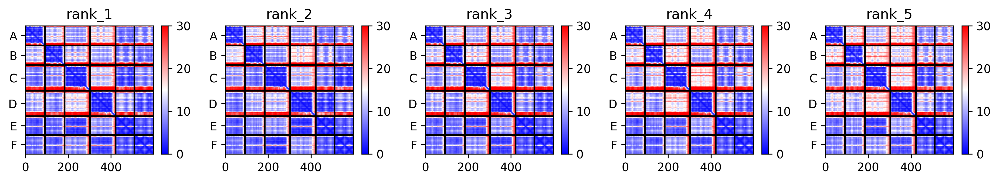
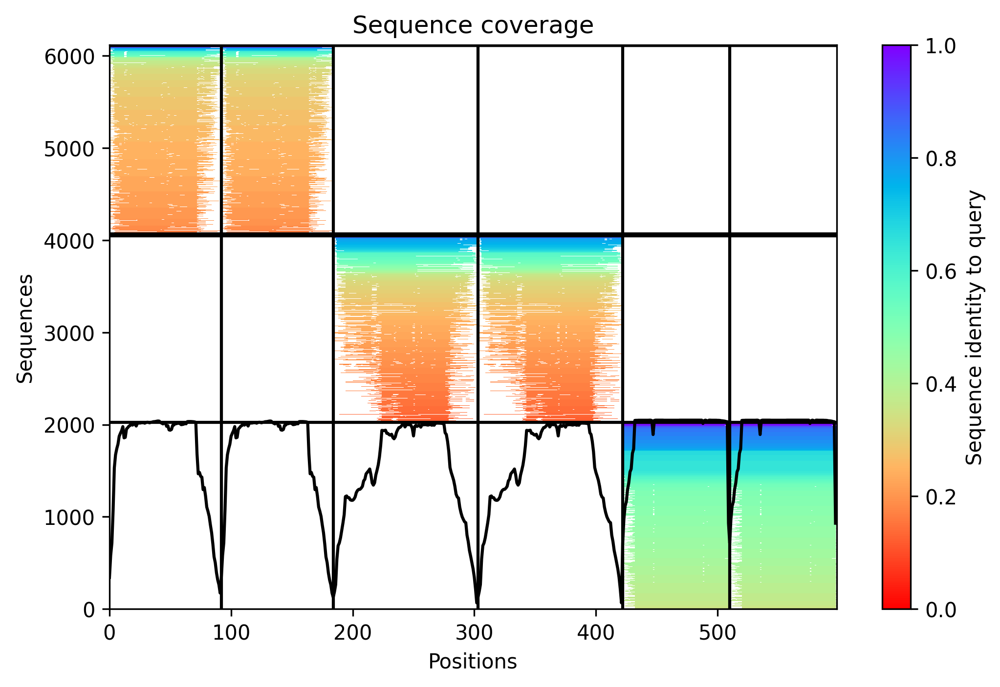
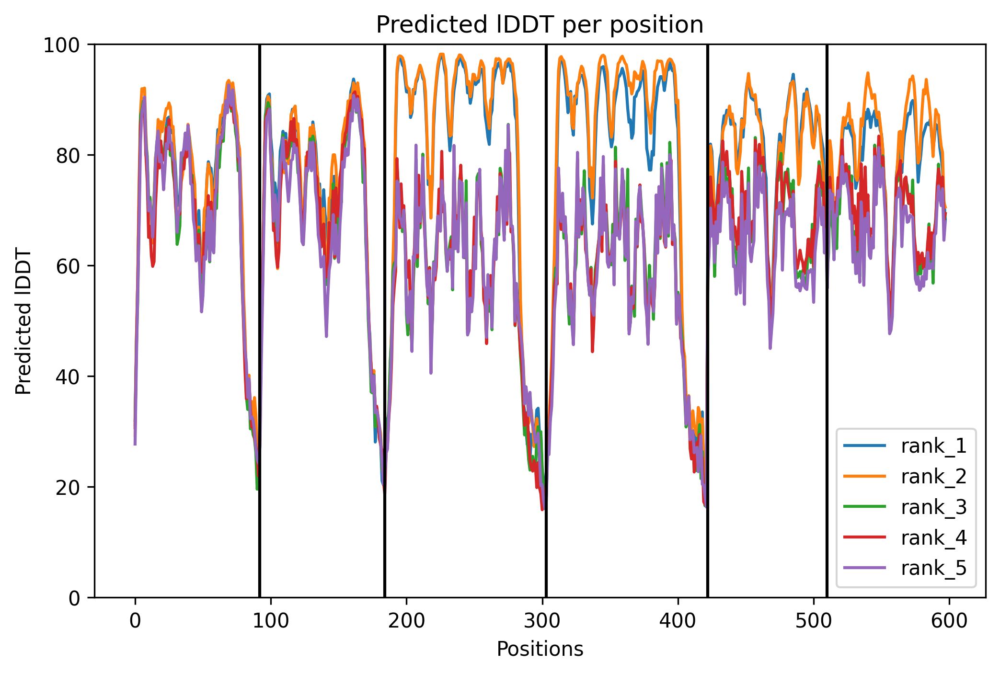

In [23]:
#@title Plots {run: "auto"}
from IPython.display import display, HTML
import base64
from html import escape

# see: https://stackoverflow.com/a/53688522
def image_to_data_url(filename):
  ext = filename.split('.')[-1]
  prefix = f'data:image/{ext};base64,'
  with open(filename, 'rb') as f:
    img = f.read()
  return prefix + base64.b64encode(img).decode('utf-8')

pae = ""
pae_file = os.path.join(jobname,f"{jobname}{jobname_prefix}_pae.png")
if os.path.isfile(pae_file):
    pae = image_to_data_url(pae_file)
cov = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_coverage.png"))
plddt = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_plddt.png"))
display(HTML(f"""
<style>
  img {{
    float:left;
  }}
  .full {{
    max-width:100%;
  }}
  .half {{
    max-width:50%;
  }}
  @media (max-width:640px) {{
    .half {{
      max-width:100%;
    }}
  }}
</style>
<div style="max-width:90%; padding:2em;">
  <h1>Plots for {escape(jobname)}</h1>
  { '<!--' if pae == '' else '' }<img src="{pae}" class="full" />{ '-->' if pae == '' else '' }
  <img src="{cov}" class="half" />
  <img src="{plddt}" class="half" />
</div>
"""))

In [24]:
#@title Package and download results
#@markdown If you are having issues downloading the result archive, try disabling your adblocker and run this cell again. If that fails click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

if msa_mode == "custom":
  print("Don't forget to cite your custom MSA generation method.")

files.download(f"{jobname}.result.zip")

if save_to_google_drive == True and drive:
  uploaded = drive.CreateFile({'title': f"{jobname}.result.zip"})
  uploaded.SetContentFile(f"{jobname}.result.zip")
  uploaded.Upload()
  print(f"Uploaded {jobname}.result.zip to Google Drive with ID {uploaded.get('id')}")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uploaded ECD_w_Activin_chopped_c404a.result.zip to Google Drive with ID 1DhjpYqa3h5T4NfxmnT_J3GbIy8F9ODdU


# Instructions <a name="Instructions"></a>
For detailed instructions, tips and tricks, see recently published paper at [Nature Protocols](https://www.nature.com/articles/s41596-024-01060-5)

**Quick start**
1. Paste your protein sequence(s) in the input field.
2. Press "Runtime" -> "Run all".
3. The pipeline consists of 5 steps. The currently running step is indicated by a circle with a stop sign next to it.

**Result zip file contents**

1. PDB formatted structures sorted by avg. pLDDT and complexes are sorted by pTMscore. (unrelaxed and relaxed if `use_amber` is enabled).
2. Plots of the model quality.
3. Plots of the MSA coverage.
4. Parameter log file.
5. A3M formatted input MSA.
6. A `predicted_aligned_error_v1.json` using [AlphaFold-DB's format](https://alphafold.ebi.ac.uk/faq#faq-7) and a `scores.json` for each model which contains an array (list of lists) for PAE, a list with the average pLDDT and the pTMscore.
7. BibTeX file with citations for all used tools and databases.

At the end of the job a download modal box will pop up with a `jobname.result.zip` file. Additionally, if the `save_to_google_drive` option was selected, the `jobname.result.zip` will be uploaded to your Google Drive.

**MSA generation for complexes**

For the complex prediction we use unpaired and paired MSAs. Unpaired MSA is generated the same way as for the protein structures prediction by searching the UniRef100 and environmental sequences three iterations each.

The paired MSA is generated by searching the UniRef100 database and pairing the best hits sharing the same NCBI taxonomic identifier (=species or sub-species). We only pair sequences if all of the query sequences are present for the respective taxonomic identifier.

**Using a custom MSA as input**

To predict the structure with a custom MSA (A3M formatted): (1) Change the `msa_mode`: to "custom", (2) Wait for an upload box to appear at the end of the "MSA options ..." box. Upload your A3M. The first fasta entry of the A3M must be the query sequence without gaps.

It is also possilbe to proide custom MSAs for complex predictions. Read more about the format [here](https://github.com/sokrypton/ColabFold/issues/76).

As an alternative for MSA generation the [HHblits Toolkit server](https://toolkit.tuebingen.mpg.de/tools/hhblits) can be used. After submitting your query, click "Query Template MSA" -> "Download Full A3M". Download the A3M file and upload it in this notebook.

**PDB100** <a name="pdb100"></a>

As of 23/06/08, we have transitioned from using the PDB70 to a 100% clustered PDB, the PDB100. The construction methodology of PDB100 differs from that of PDB70.

The PDB70 was constructed by running each PDB70 representative sequence through [HHblits](https://github.com/soedinglab/hh-suite) against the [Uniclust30](https://uniclust.mmseqs.com/). On the other hand, the PDB100 is built by searching each PDB100 representative structure with [Foldseek](https://github.com/steineggerlab/foldseek) against the [AlphaFold Database](https://alphafold.ebi.ac.uk).

To maintain compatibility with older Notebook versions and local installations, the generated files and API responses will continue to be named "PDB70", even though we're now using the PDB100.

**Using custom templates** <a name="custom_templates"></a>

To predict the structure with a custom template (PDB or mmCIF formatted): (1) change the `template_mode` to "custom" in the execute cell and (2) wait for an upload box to appear at the end of the "Input Protein" box. Select and upload your templates (multiple choices are possible).

* Templates must follow the four letter PDB naming with lower case letters.

* Templates in mmCIF format must contain `_entity_poly_seq`. An error is thrown if this field is not present. The field `_pdbx_audit_revision_history.revision_date` is automatically generated if it is not present.

* Templates in PDB format are automatically converted to the mmCIF format. `_entity_poly_seq` and `_pdbx_audit_revision_history.revision_date` are automatically generated.

If you encounter problems, please report them to this [issue](https://github.com/sokrypton/ColabFold/issues/177).

**Comparison to the full AlphaFold2 and AlphaFold2 Colab**

This notebook replaces the homology detection and MSA pairing of AlphaFold2 with MMseqs2. For a comparison against the [AlphaFold2 Colab](https://colab.research.google.com/github/deepmind/alphafold/blob/main/notebooks/AlphaFold.ipynb) and the full [AlphaFold2](https://github.com/deepmind/alphafold) system read our [paper](https://www.nature.com/articles/s41592-022-01488-1).

**Troubleshooting**
* Check that the runtime type is set to GPU at "Runtime" -> "Change runtime type".
* Try to restart the session "Runtime" -> "Factory reset runtime".
* Check your input sequence.

**Known issues**
* Google Colab assigns different types of GPUs with varying amount of memory. Some might not have enough memory to predict the structure for a long sequence.
* Your browser can block the pop-up for downloading the result file. You can choose the `save_to_google_drive` option to upload to Google Drive instead or manually download the result file: Click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

**Limitations**
* Computing resources: Our MMseqs2 API can handle ~20-50k requests per day.
* MSAs: MMseqs2 is very precise and sensitive but might find less hits compared to HHblits/HMMer searched against BFD or MGnify.
* We recommend to additionally use the full [AlphaFold2 pipeline](https://github.com/deepmind/alphafold).

**Description of the plots**
*   **Number of sequences per position** - We want to see at least 30 sequences per position, for best performance, ideally 100 sequences.
*   **Predicted lDDT per position** - model confidence (out of 100) at each position. The higher the better.
*   **Predicted Alignment Error** - For homooligomers, this could be a useful metric to assess how confident the model is about the interface. The lower the better.

**Bugs**
- If you encounter any bugs, please report the issue to https://github.com/sokrypton/ColabFold/issues

**License**

The source code of ColabFold is licensed under [MIT](https://raw.githubusercontent.com/sokrypton/ColabFold/main/LICENSE). Additionally, this notebook uses the AlphaFold2 source code and its parameters licensed under [Apache 2.0](https://raw.githubusercontent.com/deepmind/alphafold/main/LICENSE) and [CC BY 4.0](https://creativecommons.org/licenses/by-sa/4.0/) respectively. Read more about the AlphaFold license [here](https://github.com/deepmind/alphafold).

**Acknowledgments**
- We thank the AlphaFold team for developing an excellent model and open sourcing the software.

- [KOBIC](https://kobic.re.kr) and [Söding Lab](https://www.mpinat.mpg.de/soeding) for providing the computational resources for the MMseqs2 MSA server.

- Richard Evans for helping to benchmark the ColabFold's Alphafold-multimer support.

- [David Koes](https://github.com/dkoes) for his awesome [py3Dmol](https://3dmol.csb.pitt.edu/) plugin, without whom these notebooks would be quite boring!

- Do-Yoon Kim for creating the ColabFold logo.

- A colab by Sergey Ovchinnikov ([@sokrypton](https://twitter.com/sokrypton)), Milot Mirdita ([@milot_mirdita](https://twitter.com/milot_mirdita)) and Martin Steinegger ([@thesteinegger](https://twitter.com/thesteinegger)).
